# Vision Transformers Notebook: DINOv2, DETR, and Swin

This notebook provides practical examples for:

- **DINOv2** (self-supervised visual representations) on an ImageNet-style classification task.
- **DINOv3**
- **DETR** (transformer-based object detection) on COCO.
- **Swin Transformer** (hierarchical ViT) for image classification.

Each section includes:

1. Dataset setup and preprocessing.
2. Model loading and inference/training blocks.
3. Metrics computation and visualization.

At the end, a fine-tuning section shows how to adapt transformer models to your own dataset.


# Table of contents

0. [Setup](#setup)
1. [Common configuration and dataset paths](#1)
2. [DINOv2 (Self-Supervised Learning)](#2)
3. [DinoV2 - Hands on](#3)
4. [Fintuning DinoV2](#4)
5. [DinoV3](#5)
6. [Swin transformer](#6)
7. [DETR for Panoptic Segmentation](#7)
8. [Hands on with Pretrained models](#8)
9. [References](#9)


In [ ]:
!pip install torch torchvision opencv-python

In [ ]:
# Core imports used across all sections
import os
import time
import math
from pathlib import Path

import numpy as np
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Subset
from torchvision import datasets

import torchvision
from torchvision import transforms
from torchvision.datasets import ImageFolder, CocoDetection
from torchvision.models import swin_t, Swin_T_Weights

# Reproducibility and device setup
SEED = 42
torch.manual_seed(SEED)
np.random.seed(SEED)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Using device: {device}')

Using device: cuda


<a id="1" />

# 1 - Common configuration and dataset paths

This block defines paths for popular datasets:

- **ImageNet** (classification) for DINOv2/Swin examples.
- **COCO 2017** (detection) for DETR examples.

Update these paths to match your local environment before running training/evaluation cells.

In [ ]:
! mkdir -p ./data
! [ -f ./data/imagenet-256.zip ] || curl -L -o ./data/imagenet-256.zip https://www.kaggle.com/api/v1/datasets/download/dimensi0n/imagenet-256
! [ -d ./data/imagenet-256 ] || unzip -q ./data/imagenet-256.zip -d ./data/imagenet-256
! curl https://gist.githubusercontent.com/yrevar/942d3a0ac09ec9e5eb3a/raw/238f720ff059c1f82f368259d1ca4ffa5dd8f9f5/imagenet1000_clsidx_to_labels.txt > ./data/imagenet-256/clsidx.json

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100 7323M  100 7323M    0     0  34.4M      0  0:03:32  0:03:32 --:--:-- 35.6M
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 30564  100 30564    0     0   114k      0 --:--:-- --:--:-- --:--:--  115k


In [ ]:
import os
import urllib.request
import zipfile
from pathlib import Path
from tqdm import tqdm  # pip install tqdm

Path("data").mkdir(exist_ok=True)
ROOT = Path("data/coco")
ROOT.mkdir(exist_ok=True)

DOWNLOAD_TRAIN = False
DOWNLOAD_VAL   = True
DOWNLOAD_TEST  = False

URLS = {
    # Images
    "train2017":      "http://images.cocodataset.org/zips/train2017.zip",        # ~18 GB
    "val2017":        "http://images.cocodataset.org/zips/val2017.zip",           # ~1  GB
    "test2017":       "http://images.cocodataset.org/zips/test2017.zip",          # ~6  GB (optional)

    # Annotations (detection + keypoints + captions + stuff + panoptic)
    "annotations":    "http://images.cocodataset.org/annotations/annotations_trainval2017.zip",  # ~241 MB
    "test_info":      "http://images.cocodataset.org/annotations/image_info_test2017.zip",       # ~1  MB
}

class ProgressBar(tqdm):
    def update_to(self, b=1, bsize=1, tsize=None):
        if tsize is not None:
            self.total = tsize
        self.update(b * bsize - self.n)

def download(url: str, dest: Path):

    print(f"  ↓ Downloading {dest.name} ...")
    with ProgressBar(unit="B", unit_scale=True, miniters=1, desc=dest.name) as t:
        urllib.request.urlretrieve(url, dest, reporthook=t.update_to)

def extract(zip_path: Path, dest: Path):
    print(f"  ⎋ Extracting {zip_path.name} ...")
    with zipfile.ZipFile(zip_path, "r") as z:
        z.extractall(dest)
    zip_path.unlink()   # delete zip after extraction to save space
    print(f"  ✓ Done → {dest}")
# large, only needed for test-dev submissions

splits = {
    "train2017":   DOWNLOAD_TRAIN,
    "val2017":     DOWNLOAD_VAL,
    "test2017":    DOWNLOAD_TEST,
    "annotations": True,
    "test_info":   DOWNLOAD_TEST,
}

for name, enabled in splits.items():
    if not enabled:
        continue
    url      = URLS[name]
    zip_file = ROOT / Path(url).name

    if zip_file.exists():
        print(f"  ✓ Already exists: {zip_file}")
    else:
        print(f"  x Does not exist: {zip_file} ...")
        download(url, zip_file)
        extract(zip_file, ROOT)

print("\n✅ COCO download complete!")

  x Does not exist: data/coco/val2017.zip ...
  ↓ Downloading val2017.zip ...


val2017.zip: 816MB [01:41, 8.05MB/s]                           


  ⎋ Extracting val2017.zip ...
  ✓ Done → data/coco
  x Does not exist: data/coco/annotations_trainval2017.zip ...
  ↓ Downloading annotations_trainval2017.zip ...


annotations_trainval2017.zip: 253MB [00:04, 53.1MB/s]                           


  ⎋ Extracting annotations_trainval2017.zip ...
  ✓ Done → data/coco

✅ COCO download complete!


In [ ]:
# ---- Dataset paths (edit as needed) ----
IMAGENET_ROOT = Path('./data/imagenet-256')  # expected: train/ and val/ folders
COCO_ROOT = Path('./data/coco')
COCO_TRAIN_IMAGES = COCO_ROOT / 'train2017'
COCO_VAL_IMAGES = COCO_ROOT / 'val2017'
COCO_TRAIN_ANN = COCO_ROOT / 'annotations' / 'instances_train2017.json'
COCO_VAL_ANN = COCO_ROOT / 'annotations' / 'instances_val2017.json'

# Keep runs lightweight for demonstration
BATCH_SIZE = 16
NUM_WORKERS = 2
DEMO_MAX_SAMPLES = 256

print('ImageNet path:', IMAGENET_ROOT)
print('COCO val images path:', COCO_VAL_IMAGES)
print('COCO val annotations path:', COCO_VAL_ANN)

ImageNet path: data/imagenet-256
COCO val images path: data/coco/val2017
COCO val annotations path: data/coco/annotations/instances_val2017.json


<a id="2" />

# 2- DINOv2 (Self-Supervised Learning)

[DINOv2 ](https://dinov2.metademolab.com/demos?category=depth) (Self-DIstillation with NO labels, version 2) is Meta AI's self-supervised vision foundation model.

It learns universal visual features from *unlabeled* images by training a student network to match the output of a slowly-updated teacher — no labels ever needed.

The result is a ViT backbone that transfers extremely well to almost any downstream vision task.

<img src="https://raw.githubusercontent.com/EzequielMatiasArevalo/tuia-computer-vision/refs/heads/main/content/dino-v2.webp" width=800>

DINOv2 uses a variant called self-distillation, where the teacher is not a separate model but an Exponential Moving Average (EMA) of the student — making the teacher a 'momentum copy' that updates slowly and provides stable training targets.

## 2.1 What is Distillation?

Knowledge distillation is a training technique where a small model (the student) learns to mimic the behavior of a large model (the teacher), instead of — or in addition to — learning from raw ground-truth labels.

The goal is to compress the knowledge of a large expensive model into a small, fast, deployable one without losing too much quality.

[Coined by Hinton et al. (2015)](https://arxiv.org/pdf/1503.02531) with the phrase: "compress the knowledge in an ensemble into a single model."

<img src="https://raw.githubusercontent.com/EzequielMatiasArevalo/tuia-computer-vision/refs/heads/main/content/dino-v2.png" width=600>

## 2.2 DINOv2 learns depth implicitly through three mechanisms that arise naturally from self-supervised training:
1. *Perspective & scale consistency* : The multi-crop objective forces the model to match features between a small local patch (96×96) and the global view (224×224) of the same scene. To do this consistently, the model must encode how large an object is relative to the full frame — which is a proxy for distance.

2. *Occlusion reasoning* : The iBOT masked patch prediction task forces tokens to reason about context. When a patch is masked, predicting it requires understanding what's in front of and behind nearby patches — implicitly building an occlusion model, which is directly related to depth ordering.

3. *Self-attention maps segment by depth*: The attention heads in DINOv2 spontaneously learn to separate foreground from background, and objects at different depths get specialized attention patterns. This is why DINOv2 attention visualizations look like segmentation masks — the model groups things that belong to the same surface.

<img src="https://raw.githubusercontent.com/EzequielMatiasArevalo/tuia-computer-vision/refs/heads/main/content/dinov2_emergent_depth_in_patches.svg" width=600>

## 2.3 Dense Prediction Transformer

DPT is a decoder head designed for dense tasks (depth estimation, semantic segmentation) that takes patch tokens from a ViT and converts them into a pixel-level prediction.


<img src="https://raw.githubusercontent.com/EzequielMatiasArevalo/tuia-computer-vision/refs/heads/main/content/dpt.png" width=600>


<u> How Features Become a Depth Map (Emergent Properties) </u>
---

*Before diving into the decoder, it's critical to understand why DINOv2 features carry depth information in the first place — because no depth label was ever used during DINOv2's training.*

The Dense Prediction Transformer (DPT) head is what converts patch tokens into a pixel-level depth map.

It has three stages:
1. Reassemble (reshape tokens back into 2D feature maps at multiple scales)
2. Fusion (merge scales bottom-up)
3. Head (predict depth per pixel).

<img src="https://raw.githubusercontent.com/EzequielMatiasArevalo/tuia-computer-vision/refs/heads/main/content/dinov2_dpt_head_detail.svg" width=800>

Why DPT drops CLS Token ?
---

DPT needs to reshape tokens into a 2D spatial grid to reconstruct the feature map.

The CLS token has no spatial position — it doesn't correspond to any region of the image, so including it in the spatial reconstruction would be meaningless.


## 2.3 iBOT (Image BERT pre-Training with Online Tokenizer)

iBOT is a masked image modeling objective.

The core idea is borrowed from BERT in NLP: mask some tokens, then predict what they should be.
The twist is that the prediction targets are not pixels — they are the teacher network's own patch representations.

### The two losses in DINOv2

DINOv2 trains with both objectives simultaneously:
- DINO loss operates on the [CLS] token — the global image representation. The student tries to match the teacher's global view using cross-entropy. This is the original *DINO self-distillation*.

- iBOT loss operates on patch tokens. A random subset of patches (typically 30–50%) is replaced with a learnable [MASK] token before entering the student. The student then must predict the teacher's full-resolution patch representations at those masked positions. This forces the student to learn spatial, local semantics — not just global scene content.

<img src="https://raw.githubusercontent.com/EzequielMatiasArevalo/tuia-computer-vision/refs/heads/main/content/dino-v2-arch.png" width=800>

### Why this matters for segmentation

Because iBOT trains patch tokens to carry rich local semantics (not just serve as positional carriers for global attention), the resulting features are much more spatially informative.

This is exactly why raw DINOv2 patch features cluster so cleanly into *semantic segments with K-Means or PCA* — the pretraining objective explicitly demanded that adjacent patches of different objects become distinguishable.

## 2.4 Dataset and Training
The researchers used a blend of curated and uncurated data, amassing a staggering 1.2 billion unique images to form the training set.
The curated datasets were composed of multiple high-quality sources, including ImageNet-22k, the train split of ImageNet-1k, Google Landmarks, and an assortment of fine-grained datasets.
These curated images provide a broad spectrum of well-defined visual data that aids the model’s learning.

On the flip side, the uncurated dataset was sourced from publicly available web-crawled data.
To ensure the quality and safety of these images, multiple filtering techniques were applied, such as PCA hash deduplication to remove duplicates, NSFW filtering for content appropriateness, and face blurring to ensure privacy.

Source
---

The images, both curated and uncurated, were first mapped to embeddings. Uncurated images went through an extra step of deduplication before being matched with the curated ones. The result was an augmented dataset, enriched by a self-supervised retrieval system.

The LVD-142M, a large dataset consisting of *142 million images*, which the Meta AI researchers created by distributing the process across a high-performance computing cluster.

This compute cluster consisted of *20 nodes* equipped with *8 V100–32GB GPUs* and took less than 2 days to create.

This dataset was constructed using a self-supervised image retrieval pipeline, allowing the model to extract essential features directly from the images rather than relying on text descriptions.
As for the model training, they used *A100–40GB GPUs* and took *22k GPU* hours to train the Dinov2-g model.

<a id="3" />

# 3- DinoV2 - Hands on
DINOv2 provides strong visual representations from self-supervised learning. In this example:

1. We load an ImageNet-style dataset using `ImageFolder`.
2. We load a pretrained DINOv2 backbone from Torch Hub.
3. We attach a linear classifier head for supervised fine-tuning/evaluation.

In [ ]:
# DINOv2 data transforms and dataloaders
train_tfms = transforms.Compose([
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

val_tfms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

images = datasets.ImageFolder(IMAGENET_ROOT, train_tfms)

dataset_size = len(images)
train_size = int(0.7 * dataset_size)
val_size   = int(0.20 * dataset_size)
test_size  = dataset_size - train_size - val_size
sub_train, sub_val, sub_test = torch.utils.data.random_split(images, [train_size, val_size, test_size])

train_loader = DataLoader(sub_train, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS)
val_loader = DataLoader(sub_val, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS)
test_loader = DataLoader(sub_test, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS)

num_classes = len(images.classes)
print('ImageNet classes:', num_classes)

ImageNet classes: 1000


## 3.1 Loading pre-trained DinoV2 model

In [ ]:
# DINOv2 model + linear classifier head
# Note: first run may download weights from torch hub.
dinov2_backbone = torch.hub.load('facebookresearch/dinov2', 'dinov2_vitl14')
dinov2_backbone = dinov2_backbone.to(device)


Downloading: "https://github.com/facebookresearch/dinov2/zipball/main" to /root/.cache/torch/hub/main.zip


/root/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/swiglu_ffn.py:51: UserWarning: xFormers is not available (SwiGLU)
  warnings.warn("xFormers is not available (SwiGLU)")
/root/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/attention.py:33: UserWarning: xFormers is not available (Attention)
  warnings.warn("xFormers is not available (Attention)")
/root/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/block.py:40: UserWarning: xFormers is not available (Block)
  warnings.warn("xFormers is not available (Block)")


Downloading: "https://dl.fbaipublicfiles.com/dinov2/dinov2_vitl14/dinov2_vitl14_pretrain.pth" to /root/.cache/torch/hub/checkpoints/dinov2_vitl14_pretrain.pth


100%|██████████| 1.13G/1.13G [00:04<00:00, 247MB/s]


## 3.2 Defining helper functions to pre-process, draw and run PCA over the features

In [ ]:
from glob import glob
from PIL import Image

from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
import torch.nn.functional as F
import os
import cv2

def preprocess(img: Image.Image, img_size: int = 518, mean: list[float] = [0.485, 0.456, 0.406], std: list[float] = [0.229, 0.224, 0.225]) -> torch.Tensor:
    # Make divisible by patch_size=14
    img_size = (img_size // 14) * 14
    transform = transforms.Compose([
        transforms.Resize((img_size, img_size)),
        transforms.ToTensor(),
        transforms.Normalize(mean=mean, std=std),
    ])
    # check if image is gray scale
    if img.mode == 'L':
        img = img.convert('RGB')
    return transform(img).unsqueeze(0).to(device)   # [1, 3, H, W]

def draw_segmentention_mask(img: Image.Image, mask: np.ndarray) -> Image.Image:
    img = img.convert("RGBA")
    # tensor -> numpy if needed
    if hasattr(mask, "detach"):
        mask = mask.detach().cpu().numpy()
    mask = np.asarray(mask)
    # If mask has extra dims, keep a single channel
    if mask.ndim == 3:
        mask = mask.squeeze()
    if mask.ndim != 2:
        raise ValueError(f"Mask must be 2D after squeeze, got shape {mask.shape}")
    # Convert mask to uint8 alpha [0..255]
    if mask.dtype == bool:
        alpha = (mask.astype(np.uint8) * 255)
    else:
        mmin, mmax = mask.min(), mask.max()
        if mmax <= 1.0:
            alpha = (mask * 255).clip(0, 255).astype(np.uint8)
        else:
            alpha = mask.clip(0, 255).astype(np.uint8)
    alpha_img = Image.fromarray(alpha, mode="L").resize(img.size, Image.NEAREST)
    img.putalpha(alpha_img)
    return img

def pca_segment(tokens: np.ndarray, patch_h: int, patch_w: int,
                img_size: int, n_components: int = 3) -> np.ndarray:
    """Project patch tokens onto first 3 PCA components → RGB-like seg map."""
    pca = PCA(n_components=n_components)
    scaler = MinMaxScaler()
    components = pca.fit_transform(tokens)   # [N, 3]
    components = scaler.fit_transform(components)
    seg_map = components.reshape(patch_h, patch_w, n_components)  # [ph, pw, 3]

    # Upsample to original image size
    seg_tensor = torch.tensor(seg_map).permute(2, 0, 1).unsqueeze(0).float()
    seg_up = F.interpolate(seg_tensor, size=(img_size, img_size),
                           mode="bilinear", align_corners=False)
    return seg_up[0].permute(1, 2, 0).numpy() , components  # [H, W, 3], [N, 3]


## 3.3 Loading Imagenet-256 pictures

*Note*: We already downloaded imagenet on previouse notebook.

In [ ]:
data_dir = './data/imagenet-256/admiral/'
MAX_IMGS = 10
img_paths = glob(os.path.join(data_dir, '*.jpg'))[:MAX_IMGS]

batch_size = len(img_paths)
imgs_tensor = torch.zeros(batch_size, 3, 518, 518).to(device)
original_imgs = []

for i, img_path in enumerate(img_paths):
    img = Image.open(img_path)
    original_imgs.append(img)
    imgs_tensor[i] = preprocess(img)

with torch.no_grad():
  features_dict = dinov2_backbone.forward_features(imgs_tensor)
  features = features_dict['x_norm_patchtokens']
  print(features.shape)

torch.Size([10, 1369, 1024])


## Segment using Dino & PCA
We are using PCA to extract a *single principal component* (PC1) in order to separate the main feature from the background.

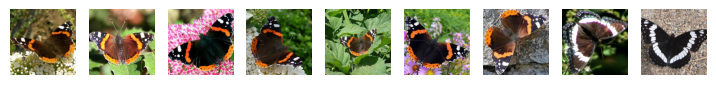

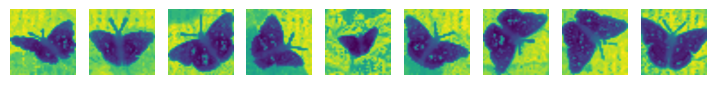

/tmp/ipykernel_3792/556141491.py:43: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  alpha_img = Image.fromarray(alpha, mode="L").resize(img.size, Image.NEAREST)


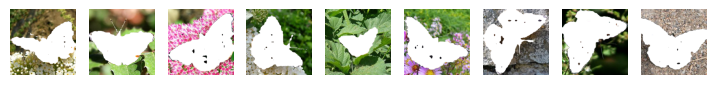

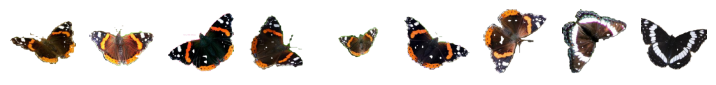

In [ ]:


features = features.cpu()
n_imgs, n_patches, n_embedding_size = features.shape
patch_h = patch_w = int(np.sqrt(n_patches))
img_size = patch_h * 14

processed_features = {
  'pca_features': [],
  'background': [],
  'bg_features': [],
  'features_foreground': []
}

for i in range(n_imgs):
  pca_features, _ = pca_segment(features[i], patch_h, patch_w, img_size, n_components=1)
  #threshold background
  threshold = 0.4
  background = pca_features > threshold

  processed_features['pca_features'].append(pca_features)
  processed_features['background'].append(background)


for i in range(1,n_imgs):
  plt.subplot(1, n_imgs, i+1)
  plt.imshow(original_imgs[i])
  plt.gcf().set_size_inches(10, 10)
  plt.axis('off')
plt.show()

for i in range(1,n_imgs):
    plt.subplot(1, n_imgs, i+1)
    patch_scores = processed_features['pca_features'][i]
    plt.imshow(patch_scores)
    # size image plot
    plt.gcf().set_size_inches(10, 10)
    plt.axis('off')
plt.show()

for i in range(1,n_imgs):
  plt.subplot(1, n_imgs, i+1)
  img_mask = draw_segmentention_mask(original_imgs[i],  processed_features['background'][i])
  plt.gcf().set_size_inches(10, 10)
  plt.imshow(img_mask)
  plt.axis('off')
plt.show()

for i in range(1,n_imgs):
  plt.subplot(1, n_imgs, i+1)
  img_mask = draw_segmentention_mask(original_imgs[i],  ~processed_features['background'][i])
  plt.gcf().set_size_inches(10, 10)
  plt.imshow(img_mask)
  plt.axis('off')
plt.show()


## Segment using Dino & KNN
Now we are using PCA with three components and comparing the results with K-Means clustering to classify the extracted features.

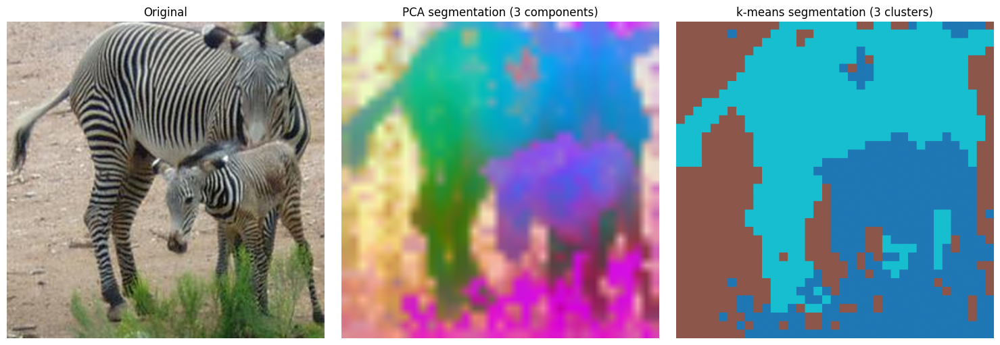

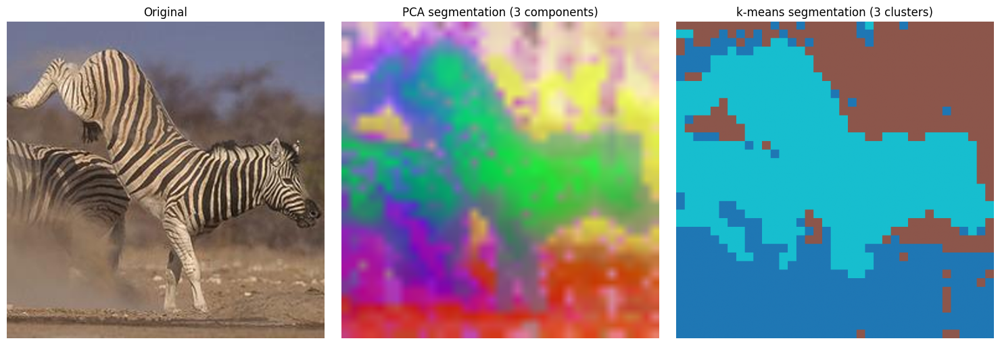

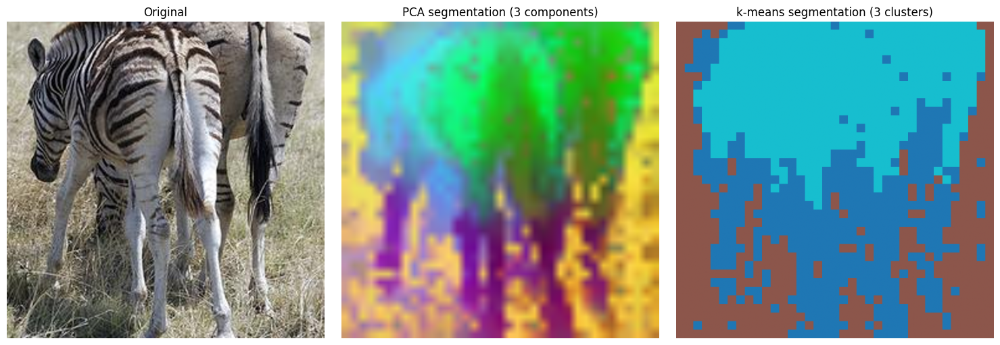

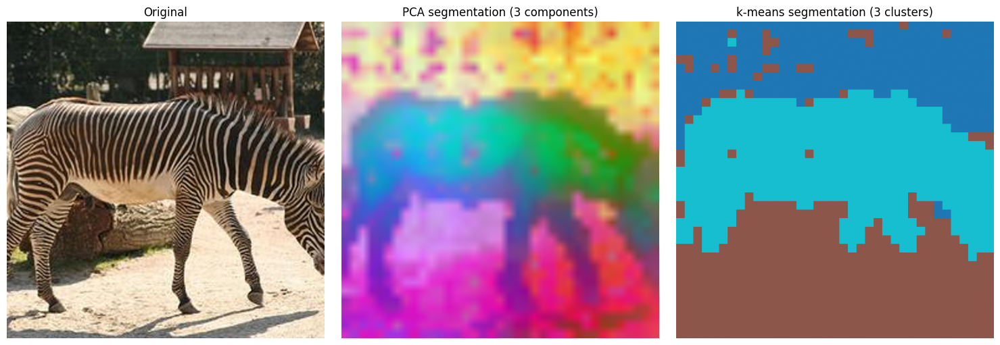

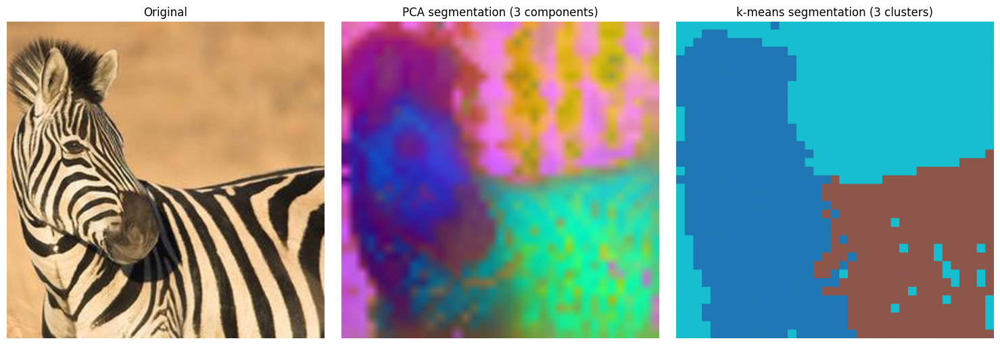

In [ ]:
import torch
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import requests


def get_patch_tokens(model, img_tensor: torch.Tensor) -> np.ndarray:
    """Returns patch token features [num_patches, embed_dim]."""
    img_tensor = img_tensor.to(device)
    with torch.no_grad():
        out = model.forward_features(img_tensor)
    # out["x_norm_patchtokens"] → [1, N, D]  (N = H/14 * W/14)
    tokens = out["x_norm_patchtokens"][0]   # [N, D]
    return tokens.cpu().numpy()

def kmeans_segment(tokens: np.ndarray, patch_h: int, patch_w: int,
                   img_size: int, n_clusters: int = 2) -> np.ndarray:
    """Cluster patch tokens → integer class map per pixel."""
    km = KMeans(n_clusters=n_clusters, n_init="auto", max_iter=1000)
    labels = km.fit_predict(tokens)              # [N]
    label_map = labels.reshape(patch_h, patch_w) # [ph, pw]

    # Upsample with nearest-neighbor (keeps crisp cluster boundaries)
    label_tensor = torch.tensor(label_map).unsqueeze(0).unsqueeze(0).float()
    label_up = F.interpolate(label_tensor, size=(img_size, img_size),
                             mode="nearest")
    return label_up[0, 0].numpy().astype(int)    # [H, W]

zebra_data_dir = './data/imagenet-256/zebra/'
MAX_IMGS = 5
zebra_img_paths = glob(os.path.join(zebra_data_dir, '*.jpg'))[:MAX_IMGS]

zebra_imgs = []
zebra_imgs_tensor = torch.zeros(MAX_IMGS, 3, 518, 518)

for i, img_path in enumerate(zebra_img_paths):
    img = Image.open(img_path)
    zebra_imgs.append(img)
    zebra_imgs_tensor[i] = preprocess(img)

for img in zebra_imgs:
    img_tensor = preprocess(img, img_size)

    patch_h = patch_w = img_size // 14   # 518//14 = 37
    tokens = get_patch_tokens(dinov2_backbone, img_tensor)  # [1369, 768]

    pca_map, components   = pca_segment(tokens, patch_h, patch_w, img_size, n_components=3)
    label_map = kmeans_segment(tokens, patch_h, patch_w, img_size, n_clusters=3)

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(img.resize((img_size, img_size)))
    axes[0].set_title("Original")

    axes[1].imshow(pca_map)
    axes[1].set_title("PCA segmentation (3 components)")

    cmap = plt.get_cmap("tab10")
    axes[2].imshow(cmap(label_map / label_map.max()))
    axes[2].set_title("k-means segmentation (3 clusters)")

    for ax in axes:
        ax.axis("off")
    plt.tight_layout()
    plt.show()


<a id="4" />

# 4- Fintuning DinoV2

These utility functions are reused for DINOv2 and Swin classification:

- `train_one_epoch_cls`: computes training loss/accuracy.
- `eval_cls`: computes validation loss/accuracy.
- `plot_history`: plots metric curves over epochs.

### 4.1 Defining helper functions

In [ ]:
from datetime import datetime

# For academic purposes and due to hardware limitations, we stop earlier than 1000 batches.

def train_one_epoch_cls(model, loader, criterion, optimizer, device, stop_at=1000):
    model.train()
    total_loss, total_correct, total = 0.0, 0, 0
    total_batches = len(loader) if hasattr(loader, '__len__') else None

    for i, (x, y) in enumerate(loader):
        start_time = datetime.now()
        x, y = x.to(device), y.to(device)
        optimizer.zero_grad()
        logits = model(x)
        loss = criterion(logits, y)
        loss.backward()
        optimizer.step()

        total_loss += loss.item() * x.size(0)
        preds = logits.argmax(dim=1)
        total_correct += (preds == y).sum().item()
        total += x.size(0)
        end_time = datetime.now()
        delta = end_time - start_time
        delta = delta.total_seconds()
        if total_batches is not None:
            remaining = max(total_batches - (i + 1), 0)
            eta = (delta * remaining) / 60
            stop_earlier_remaining = None if stop_at is None else max(stop_at - (i + 1), 0)
            eta_stop_earlier = round((delta * stop_earlier_remaining) / 60, 2) if stop_earlier_remaining is not None else None
            print(f"Batch {i+1}/{total_batches} | Loss: {loss.item():.4f} | Accuracy: {total_correct/total:.4f} | Time: {delta:.2f} | ETA: {eta:.2f} mins | ETA (stop earlier): {eta_stop_earlier} mins ", end="\r")
        else:
            print(f"Batch {i+1} | Loss: {loss.item():.4f} | Accuracy: {total_correct/total:.4f} | Time: {delta:.2f}", end="\r")

        if stop_at is not None and i > stop_at:
            print(f"Stopping at {i} batches")
            break
    return total_loss / total, total_correct / total


def eval_cls(model, loader, criterion, device, stop_at=300):
    model.eval()
    total_loss, total_correct, total = 0.0, 0, 0

    with torch.no_grad():
        for x, y in loader:
            x, y = x.to(device), y.to(device)
            logits = model(x)
            loss = criterion(logits, y)

            total_loss += loss.item() * x.size(0)
            preds = logits.argmax(dim=1)
            total_correct += (preds == y).sum().item()
            total += x.size(0)
            print(f"Validation with {total} samples, loss: {total_loss/total:.4f}, accuracy: {total_correct/total:.4f}", end="\r")
            if stop_at is not None and total > stop_at:
                print(f"Stopping at {total} samples")
                break
    return total_loss / total, total_correct / total


def plot_history(history, title='Training history'):
    epochs = range(1, len(history['train_loss']) + 1)
    fig, ax = plt.subplots(1, 2, figsize=(12, 4))

    ax[0].plot(epochs, history['train_loss'], label='train_loss')
    ax[0].plot(epochs, history['val_loss'], label='val_loss')
    ax[0].set_title('Loss')
    ax[0].set_xlabel('Epoch')
    ax[0].legend()

    ax[1].plot(epochs, history['train_acc'], label='train_acc')
    ax[1].plot(epochs, history['val_acc'], label='val_acc')
    ax[1].set_title('Accuracy')
    ax[1].set_xlabel('Epoch')
    ax[1].legend()

    fig.suptitle(title)
    plt.tight_layout()
    plt.show()

### 4.2 Defining Head for our model

In [ ]:
# Train DINOv2 linear probe for a few epochs
EPOCHS = 2


dinov2_backbone = torch.hub.load('facebookresearch/dinov2', 'dinov2_vits14')
dinov2_backbone = dinov2_backbone.to(device)
# Freeze backbone for linear probing (set False for full fine-tune)
for p in dinov2_backbone.parameters():
    p.requires_grad = False

with torch.no_grad():
    dummy = torch.randn(1, 3, 224, 224).to(device)
    feat_dim = dinov2_backbone(dummy).shape[-1]

class DinoLinearProbe(nn.Module):
    def __init__(self, backbone, in_dim, n_classes):
        super().__init__()
        self.backbone = backbone
        self.classifier = nn.Linear(in_dim, n_classes)

    def forward(self, x):
        feats = self.backbone(x)
        return self.classifier(feats)


dino_model = DinoLinearProbe(dinov2_backbone, feat_dim, num_classes).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(dino_model.classifier.parameters(), lr=1e-3, weight_decay=1e-4)

print('DINOv2 feature dim:', feat_dim)



Using cache found in /root/.cache/torch/hub/facebookresearch_dinov2_main


Downloading: "https://dl.fbaipublicfiles.com/dinov2/dinov2_vits14/dinov2_vits14_pretrain.pth" to /root/.cache/torch/hub/checkpoints/dinov2_vits14_pretrain.pth


100%|██████████| 84.2M/84.2M [00:00<00:00, 194MB/s]


DINOv2 feature dim: 384


### 4.3 Training and evaluating our model

In [ ]:

dino_history = {'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': []}

for epoch in range(EPOCHS):
    tr_loss, tr_acc = train_one_epoch_cls(dino_model, train_loader, criterion, optimizer, device)
    va_loss, va_acc = eval_cls(dino_model, val_loader, criterion, device)

    dino_history['train_loss'].append(tr_loss)
    dino_history['val_loss'].append(va_loss)
    dino_history['train_acc'].append(tr_acc)
    dino_history['val_acc'].append(va_acc)

    print(f'[DINOv2] Epoch {epoch+1}/{EPOCHS} | train_loss={tr_loss:.4f}, train_acc={tr_acc:.4f} | val_loss={va_loss:.4f}, val_acc={va_acc:.4f}')

Stopping at 1001 batches
Stopping at 304 samples
[DINOv2] Epoch 1/2 | train_loss=3.0380, train_acc=0.4558 | val_loss=1.8843, val_acc=0.5987
Stopping at 1001 batches
Stopping at 304 samples
[DINOv2] Epoch 2/2 | train_loss=1.8081, train_acc=0.6153 | val_loss=1.9284, val_acc=0.6250


## Summary of DINOv2 Fine-Tuning

For academic purposes, we fine-tune DINOv2 on an ImageNet-style dataset.

Due to hardware and time constraints, we train on a small subset of the data instead of the full dataset.  

The model is learning: training accuracy increases over epochs and training loss decreases.

However, validation performance does not improve at the same pace, which indicates overfitting because earlier stop.

<a id="5" />

# 5- DinoV3

The architecture is largely the same — the differences are in **training recipe, scale, and a few key additions**.



---

## 5.0 Data

| | DINOv2 | DINOv3 |
|---|---|---|
| Dataset | LVD-142M (142M curated images) | LVD-1689M (1.69B images — ~12× larger) |
| Curation | Retrieved from web, filtered via k-NN deduplication | Same pipeline but massively scaled, includes video frames (SA-V dataset) |

This is the single biggest change. More data at the same model size consistently beats architectural tricks.



---

## 5.1 Architecture additions in DINOv3

- **[Register tokens](https://arxiv.org/pdf/2309.16588)** — DINOv2 had none. DINOv3 adds 4, which is why your patch extraction uses `features[:, 5:, :]` instead of `features[:, 1:, :]`.
This alone significantly improves dense task quality.

- **SwiGLU FFN** — DINOv2 used standard GELU FFN. DINOv3 adopts SwiGLU.

- **RoPE (Rotary Positional Embeddings)** — DINOv2 used learned absolute position embeddings. DINOv3 switches to RoPE, improving generalization across resolutions.

- **New backbone: ConvNeXt** — DINOv2 was ViT-only. DINOv3 introduces a ConvNeXt variant trained with the same distillation objective, giving a more efficient option for dense tasks.



## 5.2 Register tokens

In DINOv3, **register tokens** are special learnable tokens added to the Vision Transformer (ViT) sequence alongside the standard patch tokens and CLS token. Their purpose is to act as dedicated:

<u>Memory Slots for Global Information</u>
---

Instead of forcing image patch tokens to carry both:

* Local spatial information
* Global semantic context

the model stores global/contextual information inside separate register tokens.

```text
[CLS] [REG1] [REG2] [REG3] [REG4] [PATCH1] [PATCH2] ... [PATCHN]
```

**Why Register Tokens Were Introduced**
---

In large Vision Transformers, researchers observed that some patch tokens developed:

* Extremely high activation norms
* Attention artifacts
* Unstable dense features

This happened because the transformer was implicitly using some patch tokens as temporary storage for global image information.
<img src="https://raw.githubusercontent.com/EzequielMatiasArevalo/tuia-computer-vision/refs/heads/main/content/dino-reg-tokens.png" width=800>

<img src="https://raw.githubusercontent.com/EzequielMatiasArevalo/tuia-computer-vision/refs/heads/main/content/dino-highnorm.png" width=800>

That creates problems for dense tasks such as:

* Segmentation
* Depth estimation
* Correspondence matching
* Dense retrieval

because patch tokens should ideally represent **Local Spatial Features**
not global memory.

**Core Idea**
---

Register tokens provide dedicated latent memory locations where the transformer can store:

* Global scene context
* Semantic summaries
* Long-range relationships
* Intermediate internal representations

This prevents corruption of local patch embeddings.


*How They Work*
---

Register tokens participate in **Self-Attention** exactly like normal transformer tokens.

This means they can:

* Attend to patch tokens
* Exchange information with CLS
* Aggregate global context
* Store intermediate semantic information

During training, the model learns automatically:

* What information to place inside registers
* How to use them efficiently

No handcrafted behavior is defined.


---

## 5.3 Training objective

Both use the same core DINO + iBOT combination (self-distillation with masked image modeling), but DINOv3 adds:

- **KoLeo regularization** — pushes embeddings to be more uniformly spread across the representation space, improving retrieval
- **Gram anchoring** — a new loss term that stabilizes training at larger batch sizes / data scale



---
## 5.4 KoLeo regularization

**The problem it solves:**
---

 Without any regularization, learned embeddings tend to collapse into clusters — many images get mapped to nearly the same point in the embedding space, wasting capacity and hurting retrieval because unrelated images look similar.

KoLeo (from *Kolmogorov-Leonenko* entropy estimation) pushes embeddings to be **uniformly spread** across the hypersphere.

**The intuition:**
---

Imagine 1000 people standing in a field. KoLeo tells each person "find your nearest neighbor and maximize your distance to them." When everyone does this simultaneously, people spread out evenly — no crowding, no empty regions.


For each embedding `zᵢ`, find its nearest neighbor in the batch, take the distance, log it, and average.

Maximizing this (minimizing the negative) pushes every embedding away from its closest neighbor — forcing uniform coverage of the space.

**Why it matters for retrieval:**
---

 A uniformly distributed embedding space means the full 384/1280 dimensions are actually being used.

DINOv2 embeddings had some dimensions that were rarely activated — KoLeo fixes this, giving you better cosine similarity discrimination between images.


---

## 5.5 Gram anchoring

**The problem it solves:**
---

At very large batch sizes and data scales, DINO-style training becomes unstable. The student network can "drift" — its feature statistics (mean, variance, covariance) shift away from the teacher's in ways that don't improve the loss but destabilize training.

<img src="https://raw.githubusercontent.com/EzequielMatiasArevalo/tuia-computer-vision/refs/heads/main/content/dino-gram-ex.png" width=800>

**The intuition:**
---

The Gram matrix of a set of features captures their covariance structure — essentially "how do these dimensions relate to each other?" Gram anchoring says: *the student's covariance structure should match the teacher's*, as an explicit constraint.

It adds this as an auxiliary loss term that keeps the student's feature covariance anchored to the teacher's throughout training.

<img src="https://raw.githubusercontent.com/EzequielMatiasArevalo/tuia-computer-vision/refs/heads/main/content/dino-gram.png" width=800>

**Why it was needed specifically for DINOv3:**
---
 DINOv2 trained on 142M images with a self-supervised teacher. DINOv3 trains on 1.69B images with a fixed ViT-7B teacher — much longer training runs at much larger scale. Without Gram anchoring, the student's feature statistics drift over billions of steps, leading to training instability or collapse.


---
## 5.6 Positional encoding: RoPE

ViT has no notion of spatial order built in — self-attention treats tokens as a set, not a sequence.
You have to tell it where each patch lives.
- *Standard ViT*: learned absolute position embeddings — you add a fixed learnable vector to each patch before the first layer.
Works fine at the trained resolution, but degrades at other resolutions (the model has never seen positions 225, 226…).

- *RoPE (Rotary Position Embedding)*: Instead of adding a position vector, RoPE rotates the Q and K vectors by an angle proportional to position before computing attention:
```math
Attention score = (R_m · q)ᵀ (R_n · k)
                = qᵀ · R_{n-m} · k   
```

Where *R_m* is a rotation matrix for position m.

The dot product naturally encodes relative distance between tokens — the model learns "how far apart are these two patches" rather than "where exactly is this patch."

This makes it much better at generalizing to different image sizes and aspect ratios without retraining.

## How they work together

| | What it fixes | When it acts |
|---|---|---|
| KoLeo | Embedding space collapse | On student output embeddings |
| Gram anchoring | Training drift at scale | On student-teacher covariance alignment |

---

## Teacher model

DINOv2's teacher was its own largest ViT-L. DINOv3 distills from a **ViT-7B teacher** — a model trained separately at much larger scale. This is a significant change: the student (even ViT-S) is now learning from a fundamentally more powerful supervisor.

---

## Summary

```text
DINOv3 = DINOv2
       + 12× more training data
       + register tokens          ← biggest quality boost for dense tasks
       + SwiGLU + RoPE            ← architecture modernization
       + ViT-7B teacher           ← stronger supervision signal
       + KoLeo + Gram anchoring   ← better training stability at scale
       + ConvNeXt variant         ← new efficient backbone option
```



## 5.6 DinoV3 - ConvNext feature maps

In [ ]:
import timm
model = timm.create_model(
    'convnext_large.dinov3_lvd1689m',
    pretrained=True,
    features_only=True,
)
model = model.eval()

# get model specific transforms (normalization, resize)
data_config = timm.data.resolve_model_data_config(model)
transforms = timm.data.create_transform(**data_config, is_training=False)

imgs = original_imgs[:5] + zebra_imgs[:5]
outputs = []
processed_imgs = []
with torch.no_grad():
    for i, img in enumerate(imgs):
        try:
            output = model(transforms(img).unsqueeze(0))  # unsqueeze single image into batch of 1
            outputs.append(output)
            processed_imgs.append(img)
        except Exception:
            print(f"Error processing image: {i}")

print("Feature maps")
for o in output[0]:
    print(o.shape)


model.safetensors:   0%|          | 0.00/785M [00:00<?, ?B/s]

Feature maps
torch.Size([192, 56, 56])


```text
B = batch size
C = channels/features
H,W = spatial resolution
```
| Stage   | Feature Map Shape  | Spatial Resolution | Channels | Main Information Learned            | Typical Usage                          |
| ------- | ------------------ | ------------------ | -------- | ----------------------------------- | -------------------------------------- |
| Stage 1 | `[1, 192, 56, 56]` | High               | 192      | Edges, textures, local patterns     | Low-level feature extraction           |
| Stage 2 | `[1, 384, 28, 28]` | Medium-High        | 384      | Shapes, contours, simple structures | Intermediate visual representation     |
| Stage 3 | `[1, 768, 14, 14]` | Medium-Low         | 768      | Object parts, semantic regions      | Dense feature extraction, segmentation |
| Stage 4 | `[1, 1536, 7, 7]`  | Low                | 1536     | High-level semantic concepts        | Embeddings, classification, retrieval  |


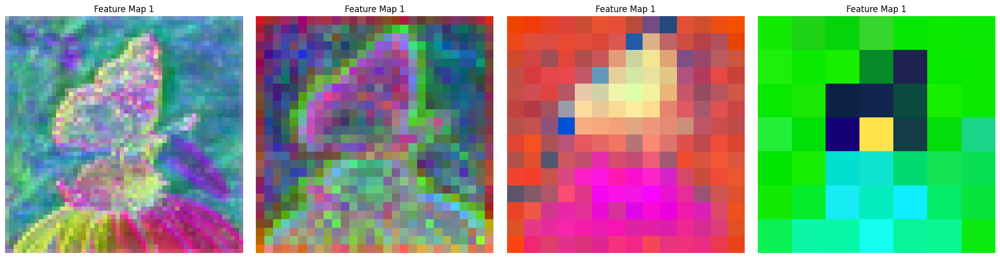

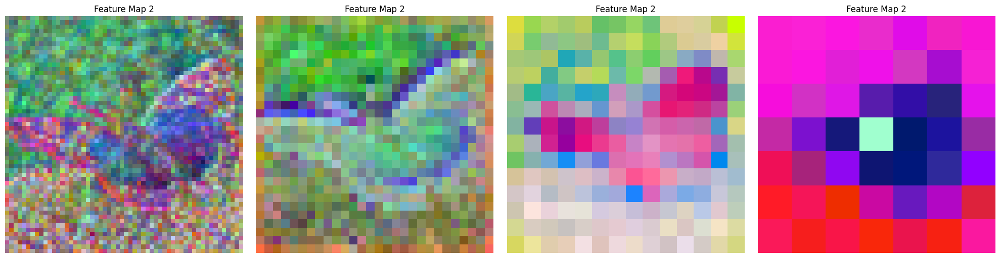

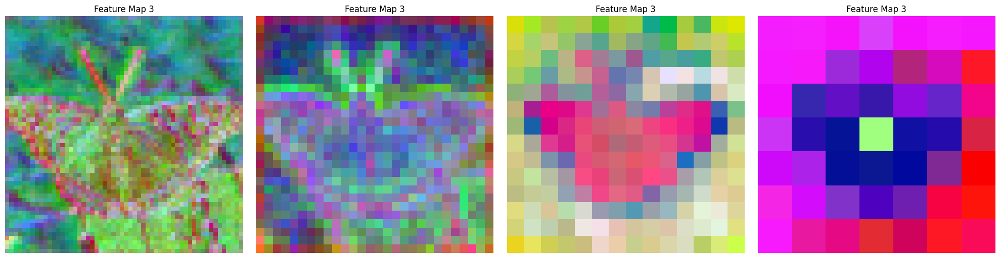

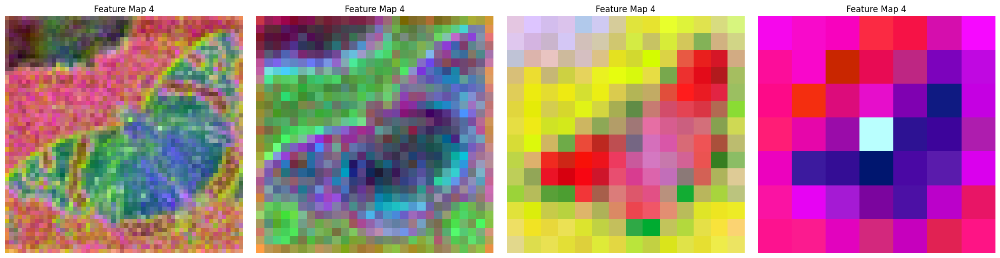

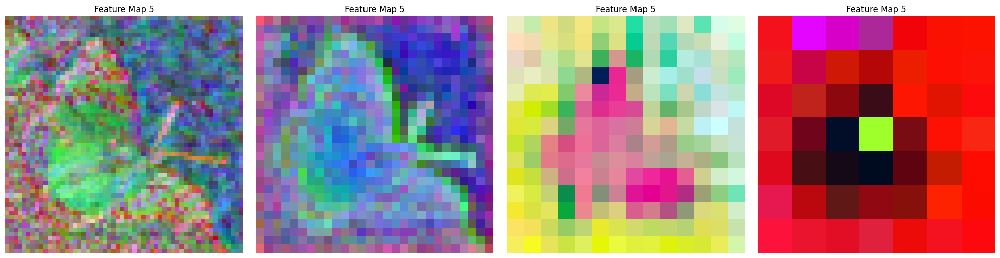

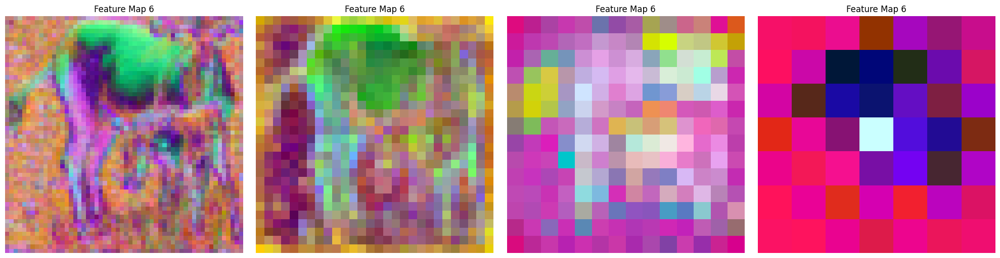

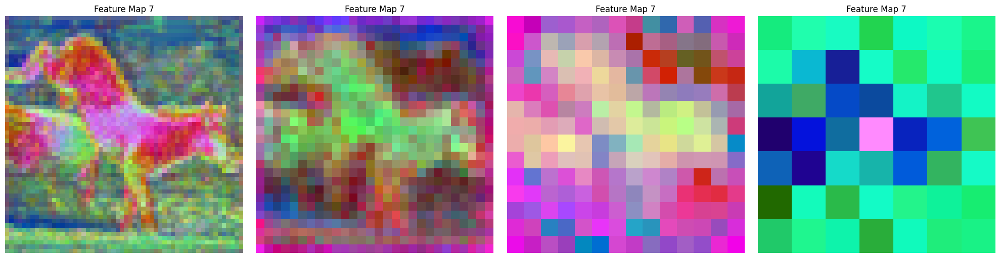

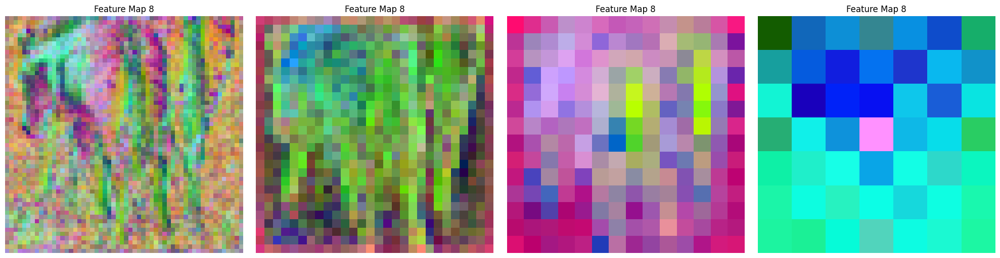

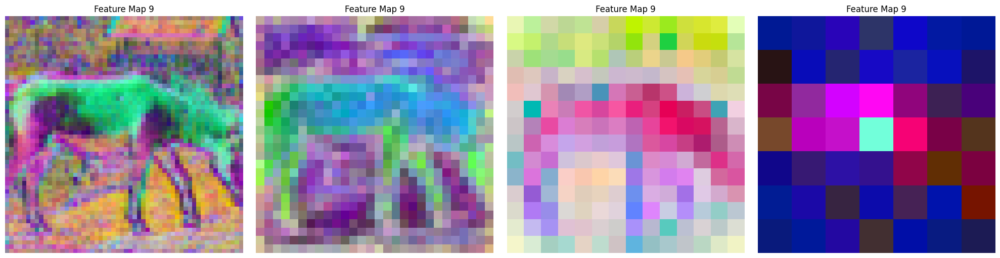

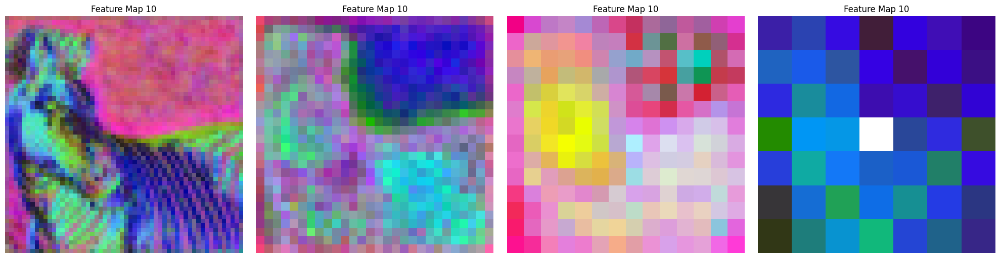

In [ ]:
scaler = MinMaxScaler()


for i, output in enumerate(outputs):
    fig, axs = plt.subplots(1, len(outputs[0]), figsize=(20, 5))

    for j, o in enumerate(output):
        # generating sub plot for each feature layer
        axs[j].set_title(f"Feature Map {i+1}")
        axs[j].axis('off')

        feat = o.squeeze(0)

        n_channels, h, w = feat.shape
        feat = feat.permute(1, 2, 0)
        feat = feat.reshape(-1, n_channels)

        pca = PCA(n_components=3)
        feat_pca = pca.fit_transform(feat)
        norm_feat_pca = scaler.fit_transform(feat_pca)

        feat_pca = norm_feat_pca.reshape(h, w, 3)
        axs[j].imshow(feat_pca)

    plt.tight_layout()
    plt.show()


## 5.7 DinoV3 - Using Vit backbone

model.safetensors:   0%|          | 0.00/86.4M [00:00<?, ?B/s]

Explained variance ratio: [0.3749117  0.26469088 0.07803285]
Total explained: 71.8%


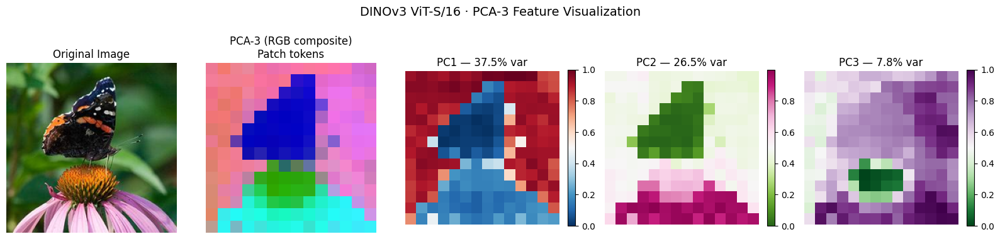

Explained variance ratio: [0.44101548 0.278013   0.04466653]
Total explained: 76.4%


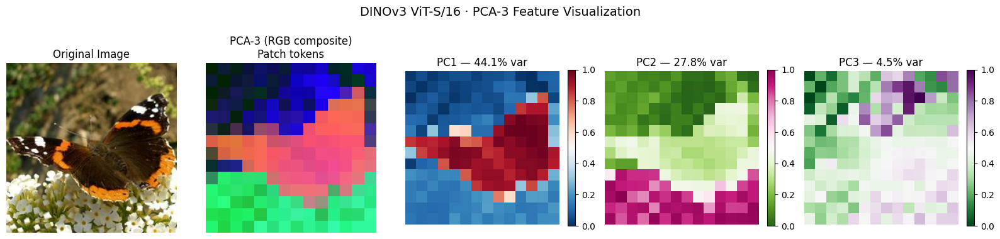

Explained variance ratio: [0.5286456  0.17665657 0.05124037]
Total explained: 75.7%


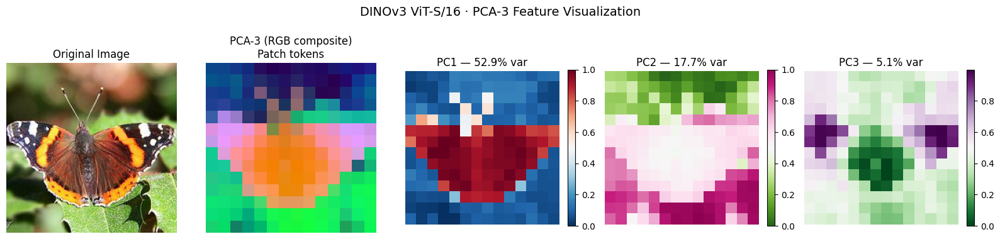

Explained variance ratio: [0.6218342  0.12093708 0.04807727]
Total explained: 79.1%


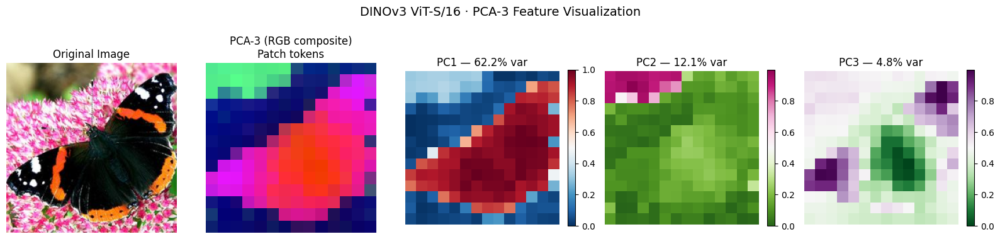

Explained variance ratio: [0.4805622  0.21949597 0.05262853]
Total explained: 75.3%


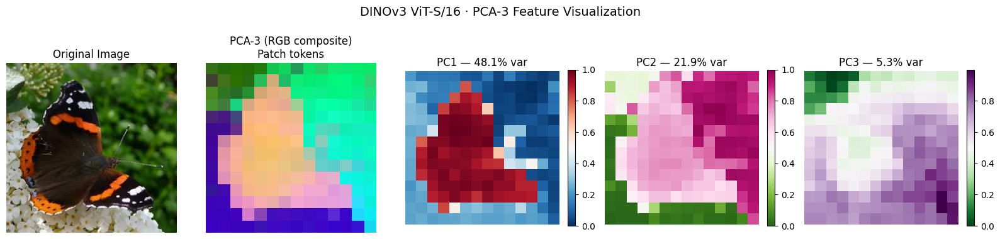

Explained variance ratio: [0.38702703 0.20610763 0.07459889]
Total explained: 66.8%


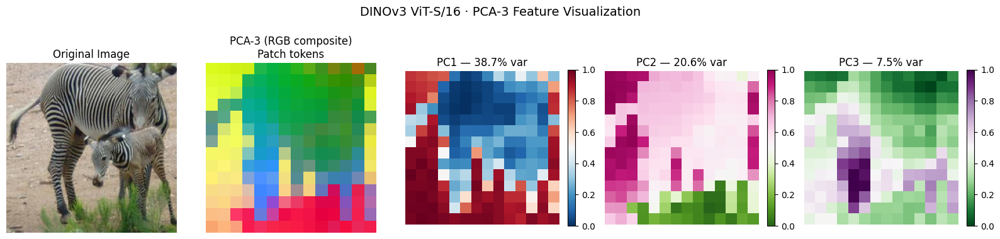

Explained variance ratio: [0.38737696 0.16026737 0.07392203]
Total explained: 62.2%


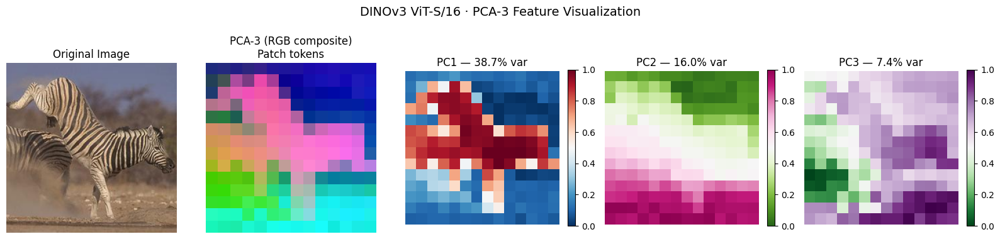

Explained variance ratio: [0.52395105 0.09551669 0.07675627]
Total explained: 69.6%


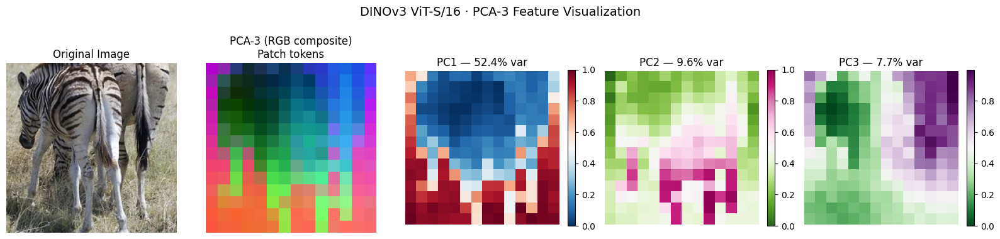

Explained variance ratio: [0.3681802  0.22075677 0.06286223]
Total explained: 65.2%


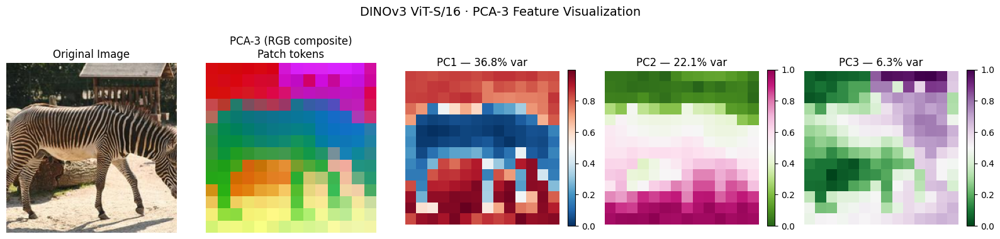

Explained variance ratio: [0.47497243 0.1682162  0.07418072]
Total explained: 71.7%


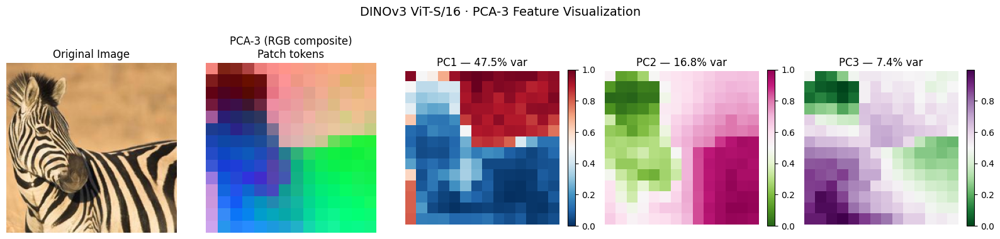

In [ ]:
import timm
import torch
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from PIL import Image
import requests
from torchvision import transforms

# ── 1. Model ─────────────────────────────────────────────────────────────────
model = timm.create_model('vit_small_patch16_dinov3.lvd1689m', pretrained=True)
model.eval()

# ── 2. Image preprocessing ───────────────────────────────────────────────────
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

rgb_imgs = [ img for img in imgs if img.mode == "RGB"]

for image in rgb_imgs:
    input_tensor = transform(image).unsqueeze(0)   # (1, 3, 224, 224)

    # ── 3. Extract patch tokens ───────────────────────────────────────────────────
    # forward_features returns ALL tokens: [CLS | 4 registers | 196 patches]
    # Shape: (B, 201, 384) for ViT-S/16
    with torch.inference_mode():
        features = model.forward_features(input_tensor)   # (1, 201, 384)

    num_registers = 4   # DINOv3 always uses 4 register tokens
    patch_tokens = features[:, 1 + num_registers:, :]    # (1, 196, 384)
    patch_tokens = patch_tokens.squeeze(0).numpy()        # (196, 384)

    # ── 4. PCA → 3 components ────────────────────────────────────────────────────
    pca = PCA(n_components=3)
    patch_pca = pca.fit_transform(patch_tokens)   # (196, 3)

    print(f"Explained variance ratio: {pca.explained_variance_ratio_}")
    print(f"Total explained: {pca.explained_variance_ratio_.sum():.1%}")

    # ── 5. Reshape & normalize → RGB image ───────────────────────────────────────
    patch_size   = 16
    h = w = 224 // patch_size   # 14 × 14 grid

    # Normalize each component independently to [0, 1]
    scaler = MinMaxScaler()
    patch_pca_norm = scaler.fit_transform(patch_pca)   # (196, 3) in [0,1]
    pca_image = patch_pca_norm.reshape(h, w, 3)         # (14, 14, 3)

    # ── 6. Visualize ─────────────────────────────────────────────────────────────
    fig, axes = plt.subplots(1, 5, figsize=(16, 4))

    axes[0].imshow(image.resize((224, 224)))
    axes[0].set_title("Original Image", fontsize=12)
    axes[0].axis("off")

    axes[1].imshow(pca_image)
    axes[1].set_title("PCA-3 (RGB composite)\nPatch tokens", fontsize=12)
    axes[1].axis("off")

    # Individual PCA components
    component_names = ["PC1", "PC2", "PC3"]
    cmaps = ["RdBu_r", "PiYG_r", "PRGn_r"]

    for i, (ax, name, cmap) in enumerate(zip(axes[2:], component_names[0:], cmaps[0:])):
        comp = patch_pca_norm[:, i].reshape(h, w)
        im = ax.imshow(comp, cmap=cmap)
        ax.set_title(f"{name} — {pca.explained_variance_ratio_[i]:.1%} var", fontsize=12)
        ax.axis("off")
        plt.colorbar(im, ax=ax, fraction=0.046)

    plt.suptitle("DINOv3 ViT-S/16 · PCA-3 Feature Visualization", fontsize=14, y=1.02)
    plt.tight_layout()
    plt.savefig("dinov3_pca3.png", dpi=150, bbox_inches="tight")
    plt.show()


---

### What's happening at each step

**Token layout** — DINOv3's ViT-S/16 outputs 201 tokens per image:

```text
[CLS(1)]     [REG(4)]      [PATCH₁ … PATCH₁₉₆]
  skip ──────────────┘     ↑ we want these
```

The 196 patches cover a 14×14 spatial grid (224 ÷ 16 = 14).

**PCA projection**

| Component | Captures | Maps to |
|-----------|----------|---------|
| PC1 | Foreground vs. background separation | R |
| PC2 | Object part boundaries | G |
| PC3 | Texture / fine detail variation | B |

**Tip — foreground masking before PCA**: a common refinement is to first threshold PC1 to isolate foreground patches, then re-run PCA only on those patches. This gives much cleaner part segmentation:




---

## 5.8 DinoV3 Backbone - Architecture Comparison

---
## Training
Both models are part of the same DINOv3 family and share the same training data (LVD-1689M) and distillation teacher (ViT-7B), but they differ fundamentally in **architecture, size, and use-case tradeoffs**.

The ConvNeXt follows the same distillation procedure but adapts it to convolutional receptive fields.

| | `dinov3-vith16plus` | `dinov3-convnext-large` |
|---|---|---|
| **Backbone** | Vision Transformer (ViT) | ConvNeXt (pure CNN) |
| **Variant** | ViT-H+/16 | ConvNeXt-Large |
| **Parameters** | ~840M | ~198M |
| **Patch/Stride** | Patch size 16 (tokenized) | Hierarchical convolutional stages |
| **Embedding dim** | 1280 | — (hierarchical feature maps) |
| **Attention heads** | 20 | N/A |
| **FFN type** | SwiGLU | Standard ConvNeXt blocks |
| **Positional encoding** | RoPE (Rotary Position Embedding )| Implicit via convolutions |
| **Register tokens** | 4 | N/A |
| **Output** | CLS token + patch tokens + register tokens | Hierarchical feature maps |

---

## Key Practical Differences

| Aspect | ViT-H+ | ConvNeXt-Large |
|--------|--------|----------------|
| **Inductive biases** | Weak (learns everything via attention) | Strong (locality, translation equivariance) |
| **Input resolution** | Fixed multiples of 16 | Natively flexible (fully convolutional) |
| **High-res inference** | Requires careful tiling | Handles arbitrary resolutions natively |
| **Memory/compute** | Heavy (840M, quadratic attention) | Much lighter (198M, linear conv cost) |
| **Dense prediction** | Patch tokens → linear head | Hierarchical feature maps → FPN-friendly |
| **Retrieval/embedding** | CLS token is strong out-of-the-box | Less natural for global embedding tasks |
| **FPN compatibility** | Needs adapter (e.g. ViTDet-style) | Naturally compatible — multi-scale outputs |

---

## When to Choose Each

**Use `ViT-H+`** when:
- You need **maximum accuracy** on global tasks (retrieval, classification, keypoint matching)
- You're doing **semantic correspondence** (SPair-71k) or **video segmentation** (DAVIS)
- Compute is not a bottleneck and you're working at 224px

**Use `ConvNeXt-Large`** when:
- You need **efficient inference** at **high or variable resolutions** (512px+)
- You're building a **detection/segmentation pipeline** with an FPN neck — ConvNeXt slots directly in
- You want a **4× smaller model** with still very competitive dense task performance
- Deploying on resource-constrained environments (edge, real-time pipelines)

---

**Bottom line:** ViT-H+ is your best feature extractor for accuracy-critical tasks. ConvNeXt-Large is the pragmatic backbone choice when you need native multi-scale features, flexible resolutions, and lower compute.

<a id="6" />

# 6- Swin transformer

## 6.1 Introduction

The **Swin Transformer** (Shifted Window Transformer) is a hierarchical Vision Transformer architecture proposed by researchers from Microsoft in 2021.

Paper: *“Swin Transformer: Hierarchical Vision Transformer using Shifted Windows”*

It was designed to overcome some important limitations of the original Vision Transformer (**ViT**), especially regarding:

* Computational cost on high-resolution images
* Lack of hierarchical feature maps
* Poor scalability for dense vision tasks

<img src="https://raw.githubusercontent.com/EzequielMatiasArevalo/tuia-computer-vision/refs/heads/main/content/swin-2.png" width=800>

Swin Transformer combines ideas from:

* **CNNs**

  * hierarchical representations
  * locality
  * multi-scale processing

with:

* **Transformers**

  * self-attention
  * long-range dependencies

---

# Why Was Swin Transformer Needed?

The original Vision Transformer processes an image as a sequence of patches using **global self-attention**.

Global attention has complexity:

O(N^2)

Where:

* (N) = number of image patches

This becomes extremely expensive for:

* high-resolution images
* object detection
* segmentation
* video processing

Additionally, ViT produces only a **single-scale representation**, unlike CNNs that naturally generate feature pyramids.

Swin Transformer solves these problems.



---

## 6.2 Main Ideas Behind Swin Transformer

The architecture introduces several important concepts:

| Concept                | Purpose                           |
| ---------------------- | --------------------------------- |
| Patch Partitioning     | Split image into small patches    |
| Hierarchical Stages    | Multi-scale feature extraction    |
| Window-based Attention | Reduce computation                |
| Shifted Windows        | Enable cross-window communication |
| Patch Merging          | Downsample features progressively |

   |


---

## 6.3 High-Level Architecture

Input image:

```text
Image → Patch Partition → Linear Embedding
       → Swin Stage 1
       → Patch Merging
       → Swin Stage 2
       → Patch Merging
       → Swin Stage 3
       → Patch Merging
       → Swin Stage 4
       → Head
```

<img src="https://raw.githubusercontent.com/EzequielMatiasArevalo/tuia-computer-vision/refs/heads/main/content/swin-1.png" width=600>

The design is hierarchical, very similar to a CNN backbone like:

* ResNet
* ConvNeXt
* EfficientNet

This makes Swin suitable for:

* classification
* object detection
* segmentation
* tracking
* video understanding


## Normal Window Partition

```text
+----+----+
| W1 | W2 |
+----+----+
| W3 | W4 |
+----+----+
```

Attention occurs only inside each window.




---

### 6.3.1 Step 1 — Patch Partition

The image is divided into non-overlapping patches.

Example:

```text
224 × 224 image
↓
4 × 4 patches
↓
56 × 56 tokens
```

Each patch is flattened and projected into an embedding vector.

Similar to ViT.



---

### 6.3.2 Step 2 — Window-Based Self-Attention (W-MSA)

Instead of computing attention globally across all tokens, Swin computes self-attention **inside local windows only**.

Example:

```text
56 × 56 feature map
↓
partition into 7 × 7 windows
↓
attention inside each window
```

This drastically reduces complexity.

---

## Complexity Comparison

### Global Attention (ViT)

O(N^2)

### Window Attention (Swin)

O(M^2N)

Where:

* (N) = total patches
* (M) = window size

Since (M) is fixed and small:

```text
Complexity becomes nearly linear
```

This is one of the biggest advantages of Swin.

---

# Problem With Fixed Windows

If attention is computed only inside windows:

```text
tokens cannot communicate across windows
```

This limits global understanding.




### 6.3.3 Step 3 — Shifted Window Mechanism

Swin solves this with the **Shifted Window** technique.



---

## 6.4 Shifted Window Partition

Next transformer block shifts the windows:

```text
  +----+----+
  | W1 | W2 |
+----+----+
| W3 | W4 |
+----+
```

Now tokens interact with neighboring windows.

This enables:

* cross-window communication
* larger receptive field
* better contextual understanding

without expensive global attention.


---

## 6.5 Swin Transformer Block

Each block contains:

| Component                        | Description              |
| -------------------------------- | ------------------------ |
| LayerNorm                        | Normalization            |
| Window Multi-Head Self-Attention | Local attention          |
| Shifted Window Attention         | Cross-window interaction |
| MLP                              | Feed-forward network     |
| Residual Connections             | Stable training          |

  

---

## 6.6 Hierarchical Representation

Unlike ViT, Swin progressively downsamples feature maps.

Example:

| Stage   | Resolution | Channels |
| ------- | ---------- | -------- |
| Stage 1 | 56×56      | 96       |
| Stage 2 | 28×28      | 192      |
| Stage 3 | 14×14      | 384      |
| Stage 4 | 7×7        | 768      |

This is very similar to CNN feature pyramids.

Important for:

* detection
* segmentation
* dense prediction tasks



---

## 6.7 Patch Merging

Patch merging acts similarly to pooling/downsampling in CNNs.

It:

* merges neighboring patches
* reduces spatial resolution
* increases channel dimension

Example:

```text
56×56×96
↓
28×28×192
```



---

## 6.8 Comparison: Swin vs ViT vs CNNs

| Feature                   | CNN       | ViT                 | Swin Transformer |
| ------------------------- | --------- | ------------------- | ---------------- |
| Locality Bias             | Strong    | Weak                | Moderate         |
| Global Context            | Limited   | Excellent           | Good             |
| Hierarchical Features     | Yes       | No                  | Yes              |
| Multi-Scale Features      | Yes       | No                  | Yes              |
| Computational Efficiency  | High      | Low on large images | High             |
| Suitable for Detection    | Excellent | Moderate            | Excellent        |
| Suitable for Segmentation | Excellent | Moderate            | Excellent        |
| Attention Mechanism       | No        | Global              | Local + Shifted  |
| Complexity                | Linear    | Quadratic           | Near Linear      |



---

## 6.9 Advantages of Swin Transformer

| Advantage                    | Explanation                         |
| ---------------------------- | ----------------------------------- |
| Efficient on High Resolution | Local windows reduce computation    |
| Hierarchical Architecture    | Similar to CNN feature pyramids     |
| Scalable                     | Works well on large images          |
| Strong Accuracy              | State-of-the-art performance        |
| Flexible Backbone            | Can replace CNN backbones           |
| Better for Dense Tasks       | Detection and segmentation friendly |
| Cross-Window Interaction     | Shifted windows improve context     |



---

## 6.10 Disadvantages

| Limitation                  | Explanation                          |
| --------------------------- | ------------------------------------ |
| More Complex Than CNNs      | Harder implementation                |
| Still Computationally Heavy | More expensive than lightweight CNNs |
| Memory Intensive            | Especially large variants            |
| Training Cost               | Requires substantial compute         |



---

## 6.11 Variants of Swin Transformer

| Model  | Description                             |
| ------ | --------------------------------------- |
| Swin-T | Tiny                                    |
| Swin-S | Small                                   |
| Swin-B | Base                                    |
| Swin-L | Large                                   |
| SwinV2 | Improved training stability and scaling |



---

## 6.12 Applications

Swin Transformer is widely used in:

| Task                  | Usage                           |
| --------------------- | ------------------------------- |
| Image Classification  | ImageNet                        |
| Object Detection      | Faster R-CNN, Mask R-CNN        |
| Semantic Segmentation | UPerNet, SegFormer-like systems |
| Face Recognition      | Transformer backbones           |
| Video Understanding   | Video Swin Transformer          |
| Medical Imaging       | MRI / CT analysis               |
| Autonomous Driving    | Perception systems              |



---

## 6.13 Swin Transformer vs ConvNeXt

ConvNeXt was partially inspired by Swin.

| Feature               | Swin      | ConvNeXt    |
| --------------------- | --------- | ----------- |
| Core Operation        | Attention | Convolution |
| Global Modeling       | Better    | Limited     |
| Efficiency            | Good      | Very Good   |
| Simplicity            | Lower     | Higher      |
| Hardware Optimization | Moderate  | Excellent   |
| Training Complexity   | Higher    | Lower  

## 6.14 Finetunning  example (ImageNet classification)

Swin Transformer is a hierarchical transformer with shifted windows. Here we:

1. Load pretrained `swin_t`.
2. Replace classification head for ImageNet-style classes.
3. Train for a few epochs and plot loss/accuracy.

Downloading: "https://download.pytorch.org/models/swin_t-704ceda3.pth" to /root/.cache/torch/hub/checkpoints/swin_t-704ceda3.pth


100%|██████████| 108M/108M [00:01<00:00, 63.8MB/s]


Stopping at 1001 batches
Stopping at 304 samples
[Swin] Epoch 1/3 | train_loss=4.6687, train_acc=0.2489 | val_loss=2.5284, val_acc=0.4967
Stopping at 1001 batches
Stopping at 304 samples
[Swin] Epoch 2/3 | train_loss=2.4843, train_acc=0.5016 | val_loss=1.7821, val_acc=0.5822
Stopping at 1001 batches
Stopping at 304 samples
[Swin] Epoch 3/3 | train_loss=2.0905, train_acc=0.5582 | val_loss=1.7364, val_acc=0.5658


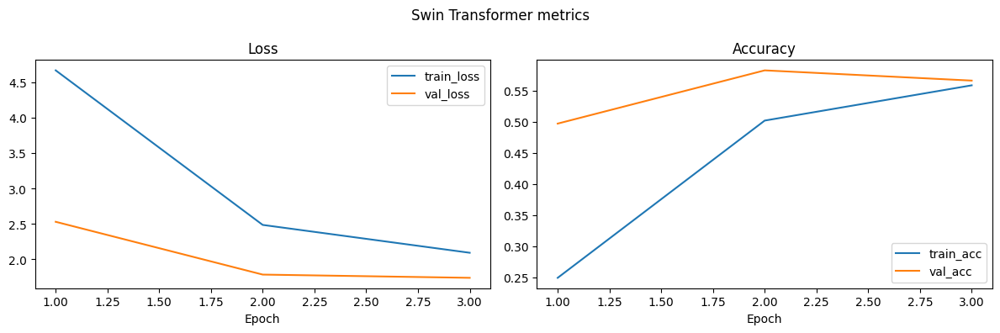

In [ ]:
# Swin Transformer fine-tuning on the same ImageNet-style subset
weights = Swin_T_Weights.IMAGENET1K_V1
swin_model = swin_t(weights=weights)

# Replace head for your target classes
in_features = swin_model.head.in_features
swin_model.head = nn.Linear(in_features, num_classes)
swin_model = swin_model.to(device)

swin_criterion = nn.CrossEntropyLoss()
swin_optimizer = optim.AdamW(swin_model.parameters(), lr=1e-4, weight_decay=5e-2)

SWIN_EPOCHS = 3
swin_history = {'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': []}

for epoch in range(SWIN_EPOCHS):
    tr_loss, tr_acc = train_one_epoch_cls(swin_model, train_loader, swin_criterion, swin_optimizer, device)
    va_loss, va_acc = eval_cls(swin_model, val_loader, swin_criterion, device)

    swin_history['train_loss'].append(tr_loss)
    swin_history['val_loss'].append(va_loss)
    swin_history['train_acc'].append(tr_acc)
    swin_history['val_acc'].append(va_acc)

    print(f'[Swin] Epoch {epoch+1}/{SWIN_EPOCHS} | train_loss={tr_loss:.4f}, train_acc={tr_acc:.4f} | val_loss={va_loss:.4f}, val_acc={va_acc:.4f}')

plot_history(swin_history, title='Swin Transformer metrics')

<a id="7" />

# 7- DETR for Panoptic Segmentation
DETR (DEtection TRansformer) extended its original object detection design to handle panoptic segmentation — the unified task of segmenting every pixel in an image, assigning both thing labels (countable objects: cars, people) and stuff labels (amorphous regions: sky, road, grass).



## Architecture Overview
The panoptic DETR pipeline stacks four major stages:

- CNN Backbone — extracts multi-scale feature maps
- Transformer Encoder-Decoder — attends over image features to produce N object queries
- Mask Head — generates per-query binary masks using multi-resolution attention maps
- Panoptic Fusion — merges thing and stuff predictions into a single coherent pixel labeling

<img src="https://raw.githubusercontent.com/EzequielMatiasArevalo/tuia-computer-vision/refs/heads/main/content/detr_panoptic_architecture.svg" width=600>

<a id="8" />

# 8- Hands on with Pretrained models

## 8.1 DeTR for panoptic segmentation

In [ ]:
from transformers import DetrForSegmentation, DetrImageProcessor
from PIL import Image
import torch
import dotenv
from glob import glob
dotenv.load_dotenv()
# Load pretrained DETR for panoptic segmentation
processor = DetrImageProcessor.from_pretrained("facebook/detr-resnet-50-panoptic")
model     = DetrForSegmentation.from_pretrained("facebook/detr-resnet-50-panoptic")


images_path = glob("data/coco/val2017/*.jpg")
selected_imgs = [1,2,4,6,8,9]
processed_images = []
pil_images = []
for img_path in [images_path[i] for i in selected_imgs]:
    image  = Image.open(img_path)
    pil_images.append(image)
    inputs = processor(images=image, return_tensors="pt")
    processed_images.append(inputs)
# inputs["pixel_values"] shape: (1, 3, H, W) — padded to max multiple of 32
print(f"pixel_values shape: {inputs['pixel_values'].shape} | pixel_mask shape: {inputs['pixel_mask'].shape}")

/usr/local/lib/python3.12/dist-packages/torch/nn/modules/module.py:2586: UserWarning: for conv1.weight: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pass `assign=True` to assign items in the state dictionary to their corresponding key in the module instead of copying them in place?)
  module._load_from_state_dict(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/batchnorm.py:133: UserWarning: for bn1.weight: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pass `assign=True` to assign items in the state dictionary to their corresponding key in the module instead of copying them in place?)
  super()._load_from_state_dict(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/batchnorm.py:133: UserWarning: for bn1.bias: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, whi

Loading weights:   0%|          | 0/562 [00:00<?, ?it/s]

DetrForSegmentation LOAD REPORT from: facebook/detr-resnet-50-panoptic
Key                                                                              | Status     |  | 
---------------------------------------------------------------------------------+------------+--+-
detr.model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked | UNEXPECTED |  | 
detr.model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked | UNEXPECTED |  | 
detr.model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked | UNEXPECTED |  | 
detr.model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


pixel_values shape: torch.Size([1, 3, 800, 1193]) | pixel_mask shape: torch.Size([1, 800, 1193])


In [ ]:
from datetime import datetime

results = []
for inputs in processed_images:
    print("="*50)
    inference_start_time = datetime.now()
    with torch.no_grad():
        outputs = model(**inputs)
    inference_end_time = datetime.now()
    inference_time = inference_end_time - inference_start_time
    print(f"Time taken: {inference_time}")

    # Post-process → panoptic segmentation
    post_process_start_time = datetime.now()
    target_sizes = [pil_images[0].size[::-1]]  # (H, W)
    result = processor.post_process_panoptic_segmentation(
        outputs,
        target_sizes=target_sizes,
        threshold=0.85,
        mask_threshold=0.5,
    )[0]
    post_process_end_time = datetime.now()
    post_process_time = post_process_end_time - post_process_start_time
    print(f"Time taken: {post_process_time}")
    results.append(result)
    # result["segmentation"]:  (H, W) int tensor — unique segment ids
    # result["segments_info"]: list of dicts with id, label_id, score, isthing
    for seg in result["segments_info"]:
        print(f"id={seg['id']:3d}  label={seg['label_id']:3d}   score={seg['score']:.3f}")
    print("Total time taken: ", inference_time + post_process_time)

Time taken: 0:00:18.838899
Time taken: 0:00:00.223692
id=  1  label= 39   score=0.998
id=  2  label=  1   score=0.985
id=  3  label=161   score=0.852
id=  4  label=  1   score=0.998
id=  5  label=  1   score=1.000
id=  6  label=  1   score=0.960
id=  7  label=  1   score=0.970
id=  8  label= 40   score=0.999
id=  9  label=  1   score=0.992
id= 10  label= 62   score=0.991
id= 11  label=  1   score=0.970
id= 12  label=  1   score=0.954
id= 13  label=199   score=0.952
id= 14  label=  1   score=1.000
id= 15  label=  1   score=0.999
id= 16  label=  1   score=1.000
id= 17  label=194   score=0.938
id= 18  label= 62   score=0.987
id= 19  label= 62   score=0.904
id= 20  label=  1   score=0.999
id= 21  label= 62   score=0.955
id= 22  label=  1   score=0.998
Total time taken:  0:00:19.062591
Time taken: 0:00:16.611979
Time taken: 0:00:00.106946
id=  1  label=  3   score=0.970
id=  2  label=  1   score=0.957
id=  3  label=  1   score=0.932
id=  4  label=197   score=0.996
id=  5  label=191   score=

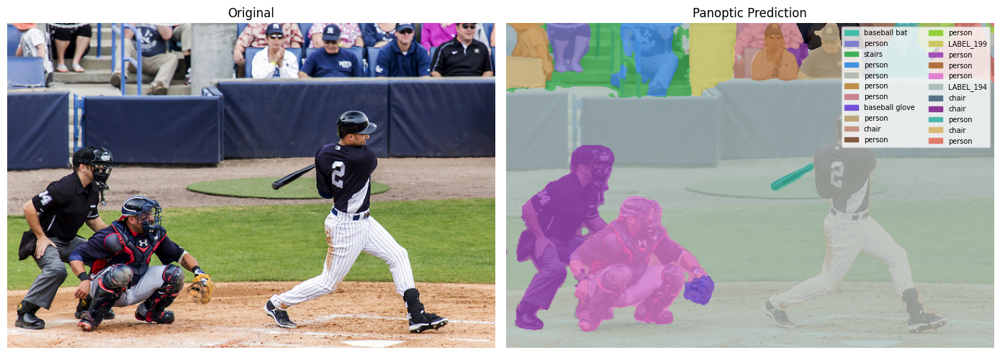

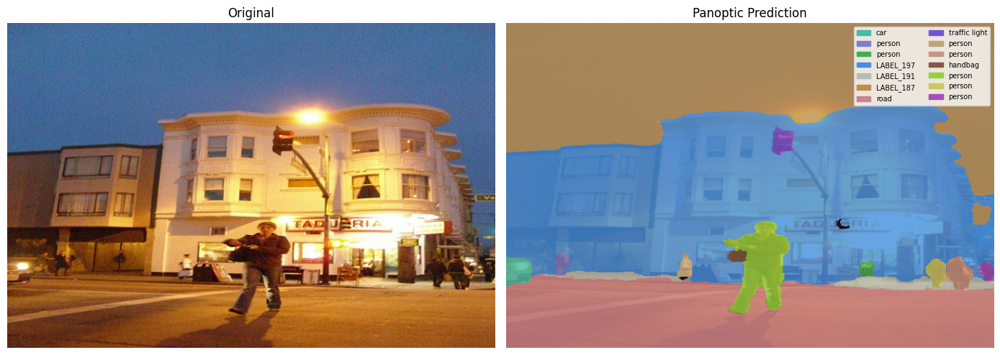

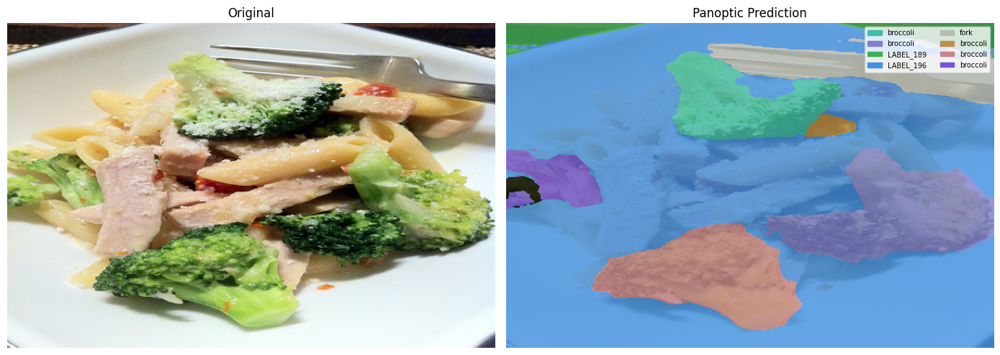

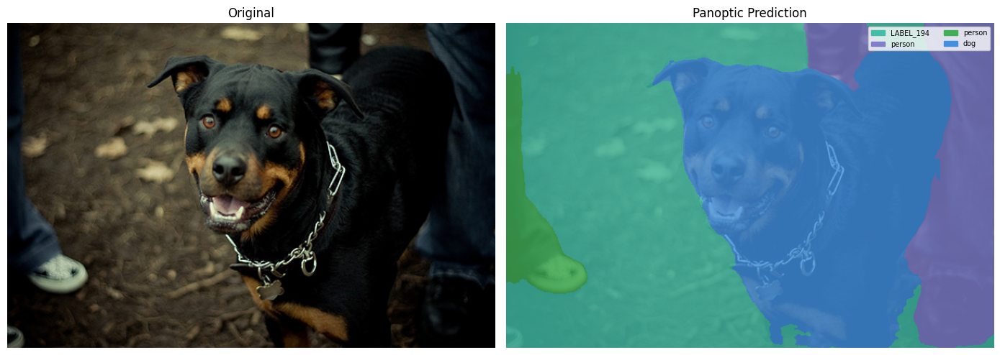

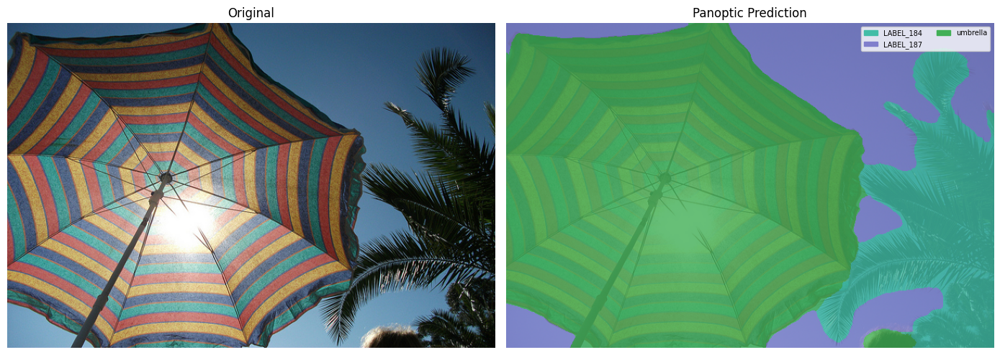

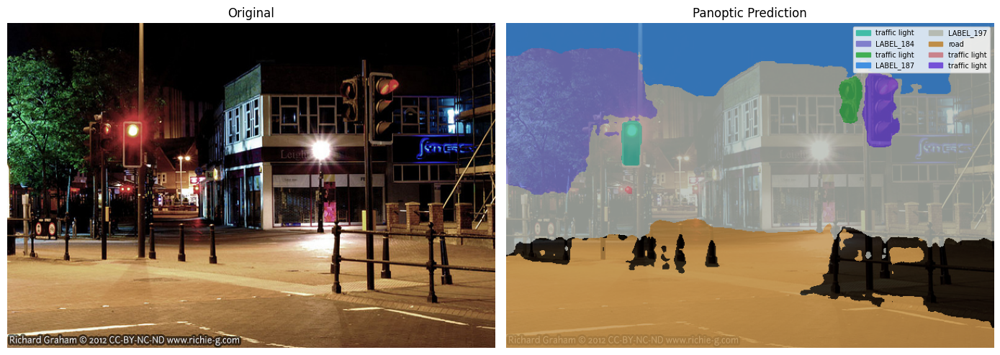

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from PIL import Image

from transformers import AutoConfig

def visualize_panoptic(image, result, id2label):
    seg   = result["segmentation"].numpy()
    infos = result["segments_info"]

    # Assign a random color per segment
    rng    = np.random.default_rng(42)
    colors = rng.integers(50, 230, size=(len(infos), 3))
    # segmentation shape
    h, w = seg.shape

    image = image.resize((w, h))

    canvas = np.zeros((h, w, 3), dtype=np.uint8)
    patches = []
    for color, info in zip(colors, infos):
        mask           = seg == info["id"]
        canvas[mask]   = color
        label          = id2label[info["label_id"]]
        tag            = label
        patches.append(mpatches.Patch(color=color/255, label=tag))

    # Fusion image with mask
    canvas = Image.fromarray(canvas)
    canvas = Image.blend(image, canvas, 0.8)

    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    axes[0].imshow(image)
    axes[0].set_title("Original")
    axes[0].axis("off")
    axes[1].imshow(canvas)
    axes[1].set_title("Panoptic Prediction")
    axes[1].axis("off")
    axes[1].legend(handles=patches, loc="upper right", fontsize=7, ncol=2)
    plt.tight_layout()
    plt.show()

# COCO panoptic has 133 categories (80 things + 53 stuff)
cfg     = AutoConfig.from_pretrained("facebook/detr-resnet-50-panoptic")
id2label = cfg.id2label
for image, result in zip(pil_images, results):
    visualize_panoptic(image, result, id2label)

## 8.2 Swin and DinoV2 for classification

This section runs **inference-only** examples using pretrained checkpoints, so you can inspect baseline behavior before any task-specific fine-tuning.

We include:

1. **DINOv2 pretrained classifier** (`dinov2_vits14_lc`) top-5 predictions.
2. **Swin pretrained ImageNet model** top-5 predictions.
3. **DETR pretrained detector** with bounding box visualization on a sample image.

Using cache found in /root/.cache/torch/hub/facebookresearch_dinov2_main


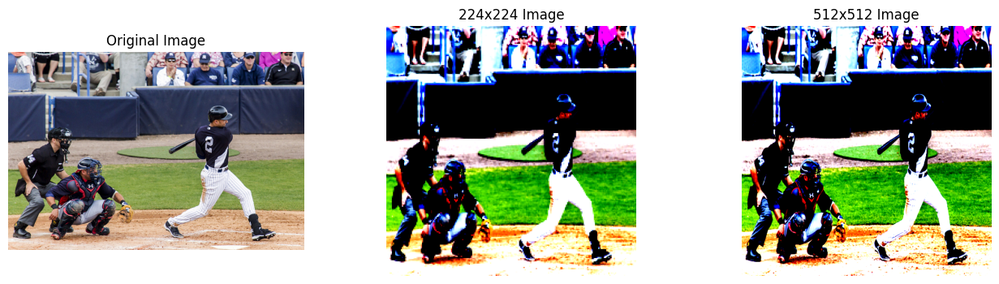


DINOv2 pretrained top-5 predictions | 224x224:
1. ballplayer (0.8606)
2. baseball (0.1386)
3. scoreboard (0.0004)

DINOv2 pretrained top-5 predictions | 512x512:
1. ballplayer (0.8681)
2. baseball (0.1310)
3. knee pad (0.0004)

Swin pretrained top-5 predictions | 224x224:
1. ballplayer (0.7921)
2. baseball (0.0884)
3. scoreboard (0.0008)

Swin pretrained top-5 predictions | 512x512:
1. ballplayer (0.7502)
2. baseball (0.0613)
3. racket (0.0028)


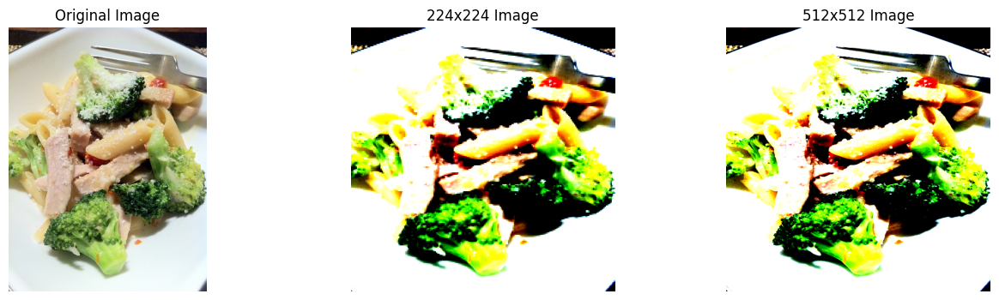


DINOv2 pretrained top-5 predictions | 224x224:
1. broccoli (0.9977)
2. carbonara (0.0009)
3. plate (0.0007)

DINOv2 pretrained top-5 predictions | 512x512:
1. broccoli (0.9903)
2. carbonara (0.0072)
3. plate (0.0009)

Swin pretrained top-5 predictions | 224x224:
1. broccoli (0.8222)
2. plate (0.0161)
3. carbonara (0.0074)

Swin pretrained top-5 predictions | 512x512:
1. broccoli (0.5891)
2. plate (0.0310)
3. carbonara (0.0245)


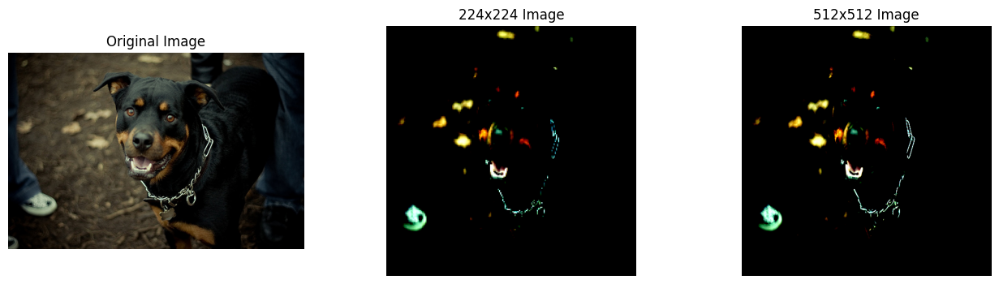


DINOv2 pretrained top-5 predictions | 224x224:
1. Rottweiler (0.6864)
2. Doberman (0.2529)
3. Appenzeller (0.0178)

DINOv2 pretrained top-5 predictions | 512x512:
1. Rottweiler (0.8914)
2. Doberman (0.0487)
3. Greater Swiss Mountain dog (0.0172)

Swin pretrained top-5 predictions | 224x224:
1. Rottweiler (0.8784)
2. Doberman (0.0259)
3. Appenzeller (0.0028)

Swin pretrained top-5 predictions | 512x512:
1. Rottweiler (0.2944)
2. Doberman (0.0836)
3. miniature pinscher (0.0121)


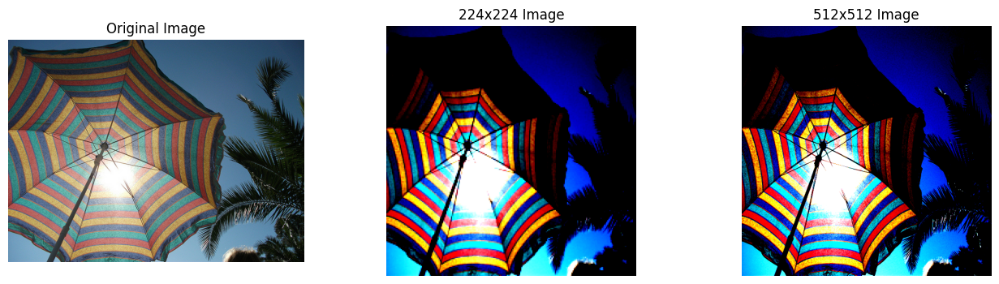


DINOv2 pretrained top-5 predictions | 224x224:
1. umbrella (0.9994)
2. parachute (0.0002)
3. maillot tank suit (0.0001)

DINOv2 pretrained top-5 predictions | 512x512:
1. umbrella (0.9995)
2. maillot tank suit (0.0001)
3. vault (0.0001)

Swin pretrained top-5 predictions | 224x224:
1. umbrella (0.9307)
2. dome (0.0008)
3. parachute (0.0007)

Swin pretrained top-5 predictions | 512x512:
1. umbrella (0.7080)
2. flagpole (0.0038)
3. sarong (0.0036)


In [ ]:
# Pretrained DINOv2 and Swin top-k predictions on one validation image
imagenet_labels = Swin_T_Weights.IMAGENET1K_V1.meta['categories']

# Grab one sample from validation loader
# sample_batch = next(iter(val_loader))
# sample_x, sample_y = sample_batch[0][0:1].to(device), sample_batch[1][0].item()

tfms_224 = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

tfms_518 = transforms.Compose([
    transforms.Resize((518, 518)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

dinov2_pretrained_cls = torch.hub.load('facebookresearch/dinov2', 'dinov2_vits14_lc').to(device).eval()
swin_pretrained = swin_t(weights=Swin_T_Weights.IMAGENET1K_V1).to(device).eval()

#gorilla_images = glob(f"{IMAGENET_ROOT}/gorilla/*.jpg"
#for img_path in gorilla_images[:3]:
test_imgs = [0,2,3,4]
for img in [ pil_images[i] for i in test_imgs]:
    fig, axes = plt.subplots(1, 3, figsize=(16, 4))

    # img = Image.open(img_path)
    #checking if image is RGB
    if img.mode != 'RGB':
        img = img.convert('RGB')
    #checking if image is grayscale
    if img.mode == 'L':
        img = img.convert('RGB')

    img_224 = tfms_224(img)
    img_518 = tfms_518(img)

    axes[0].imshow(img)
    axes[0].set_title("Original Image", fontsize=12)
    axes[0].axis("off")

    axes[1].imshow(img_224.cpu().permute(1, 2, 0).numpy())
    axes[1].set_title("224x224 Image", fontsize=12)
    axes[1].axis("off")

    axes[2].imshow(img_518.cpu().permute(1, 2, 0).numpy())
    axes[2].set_title("512x512 Image", fontsize=12)
    axes[2].axis("off")

    plt.show()
    # ---- DINOv2 pretrained classifier (with linear head) ----
    # Note: this is a pretrained classification checkpoint, not the custom linear probe defined above.

    with torch.no_grad():
        dino_logits = dinov2_pretrained_cls(img_224.unsqueeze(0).to(device))
        dino_probs = torch.softmax(dino_logits, dim=1)
        dino_top_prob, dino_top_idx = torch.topk(dino_probs, k=3, dim=1)

        dino_logits_518 = dinov2_pretrained_cls(img_518.unsqueeze(0).to(device))
        dino_probs_518 = torch.softmax(dino_logits_518, dim=1)
        dino_top_prob_518, dino_top_idx_518 = torch.topk(dino_probs_518, k=3, dim=1)

    print("="*50)
    print('\nDINOv2 pretrained top-5 predictions | 224x224:')
    for rank, (idx, prob) in enumerate(zip(dino_top_idx[0].cpu().tolist(), dino_top_prob[0].cpu().tolist()), start=1):
        print(f'{rank}. {imagenet_labels[idx]} ({prob:.4f})')

    print("\nDINOv2 pretrained top-5 predictions | 512x512:")
    for rank, (idx, prob) in enumerate(zip(dino_top_idx_518[0].cpu().tolist(), dino_top_prob_518[0].cpu().tolist()), start=1):
        print(f'{rank}. {imagenet_labels[idx]} ({prob:.4f})')

    with torch.no_grad():
        swin_logits = swin_pretrained(img_224.unsqueeze(0).to(device))
        swin_probs = torch.softmax(swin_logits, dim=1)
        swin_top_prob, swin_top_idx = torch.topk(swin_probs, k=3, dim=1)

        swin_logits_518 = swin_pretrained(img_518.unsqueeze(0).to(device))
        swin_probs_518 = torch.softmax(swin_logits_518, dim=1)
        swin_top_prob_518, swin_top_idx_518 = torch.topk(swin_probs_518, k=3, dim=1)

    print('\nSwin pretrained top-5 predictions | 224x224:')
    for rank, (idx, prob) in enumerate(zip(swin_top_idx[0].cpu().tolist(), swin_top_prob[0].cpu().tolist()), start=1):
        print(f'{rank}. {imagenet_labels[idx]} ({prob:.4f})')

    print("\nSwin pretrained top-5 predictions | 512x512:")
    for rank, (idx, prob) in enumerate(zip(swin_top_idx_518[0].cpu().tolist(), swin_top_prob_518[0].cpu().tolist()), start=1):
        print(f'{rank}. {imagenet_labels[idx]} ({prob:.4f})')



### Summary and Notes !
- *Swin-T classifier is strongly tuned* to ImageNet-style classification at a fixed recipe (typically 224x224 with specific crop statistics).
Doubling resolution changes texture frequency, object scale, and patch distribution, so features can shift from what its head expects.

- *DINOv2 features are more scale-robust because self-supervised pretraining* (multi-crop / global-local views) teaches invariance across different crop sizes and object scales.
So when resolution changes, embeddings remain more stable.

- *Windowed attention in Swin is local by design*.
At higher resolution, the same object spans more patches/windows; local context composition changes, and the pretrained classifier head may not generalize as well without retuning.

- *Linear classification head sensitivity*:
For Swin pretrained on a specific data distribution, logits can degrade if input statistics shift.
DINOv2 pretrained representations are often more transferable and robust under such shifts.

- Preprocessing mismatch can amplify this:
If resizing/normalization/cropping differs from pretrained expectations, Swin can drop faster than DINOv2.

## 8.3 DETR example (COCO object detection)

DETR treats detection as a set prediction task with transformers. This section:

1. Loads COCO validation images.
2. Runs pretrained DETR inference.
3. Tracks simple detection metrics (detections per image and confidence distribution).

For full object detection evaluation (mAP), use `pycocotools` with COCO eval APIs.

loading annotations into memory...
Done (t=0.74s)
creating index...
index created!
Downloading: "https://github.com/facebookresearch/detr/zipball/main" to /root/.cache/torch/hub/main.zip


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 143MB/s]


Downloading: "https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth" to /root/.cache/torch/hub/checkpoints/detr-r50-e632da11.pth


100%|██████████| 159M/159M [00:03<00:00, 48.9MB/s]


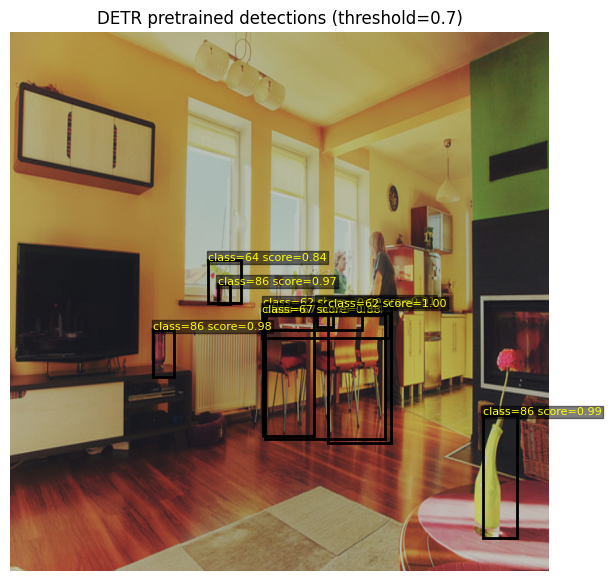

Kept detections: 10


In [ ]:
from PIL import Image
import matplotlib.patches as patches
import torchvision.transforms.functional as F

# Load COCO val dataset
coco_val = CocoDetection(
    root=str(COCO_VAL_IMAGES),
    annFile=str(COCO_VAL_ANN),
    transform=transforms.Compose([
        transforms.Resize((800, 800)),
        transforms.ToTensor(),
    ])
)

coco_subset = Subset(coco_val, list(range(min(64, len(coco_val)))))

sample_image_path = Path('./data/coco_sample.jpg')
if sample_image_path.exists():
    pil_img = Image.open(sample_image_path).convert('RGB')
else:
    # Fallback: use first image from COCO subset
    pil_img, _ = coco_subset[0]
    if isinstance(pil_img, torch.Tensor):
        pil_img = transforms.ToPILImage()(pil_img)

# DETR expects normalized tensor input
detr = torch.hub.load('facebookresearch/detr', 'detr_resnet50', pretrained=True)
detr = detr.to(device).eval()

detr_infer_tfms = transforms.Compose([
    transforms.Resize((800, 800)),
    transforms.ToTensor(),
])

x = detr_infer_tfms(pil_img).unsqueeze(0).to(device)

with torch.no_grad():
    out = detr(x)

probas = out['pred_logits'].softmax(-1)[0, :, :-1]
scores, labels = probas.max(-1)
keep = scores > 0.7
boxes = out['pred_boxes'][0, keep].detach().cpu()
labels_kept = labels[keep].detach().cpu()
scores_kept = scores[keep].detach().cpu()

# Convert cx,cy,w,h (normalized) -> x1,y1,w,h in pixel coords
w_img, h_img = pil_img.size
fig, ax = plt.subplots(1, 1, figsize=(10, 7))
ax.imshow(pil_img)

for b, cls_id, sc in zip(boxes, labels_kept, scores_kept):
    cx, cy, bw, bh = b.tolist()
    x1 = (cx - bw / 2.0) * w_img
    y1 = (cy - bh / 2.0) * h_img
    rect_w = bw * w_img
    rect_h = bh * h_img

    rect = patches.Rectangle((x1, y1), rect_w, rect_h, fill=False, linewidth=2)
    ax.add_patch(rect)
    ax.text(x1, y1, f'class={int(cls_id)} score={float(sc):.2f}', color='yellow', fontsize=8,
            bbox=dict(facecolor='black', alpha=0.5, pad=1))

ax.set_title('DETR pretrained detections (threshold=0.7)')
ax.axis('off')
plt.show()

print(f'Kept detections: {int(keep.sum().item())}')

<a id="9" />

# References

- [Vision Transformers for Dense Prediction](https://arxiv.org/pdf/2103.13413)
- [GLU Variants Improve Transformer](https://arxiv.org/pdf/2002.05202)
- [KoLEO - SPREADING VECTORS FOR SIMILARITY SEARCH](https://arxiv.org/pdf/1806.03198)
- [ROFORMER: ENHANCED TRANSFORMER WITH ROTARY
POSITION EMBEDDING](https://arxiv.org/pdf/2104.09864)
- [DINOv2: Learning Robust Visual Features without Supervision](https://arxiv.org/pdf/2304.07193)
- [DINOv3](https://arxiv.org/pdf/2508.10104)
- [DeTR](https://arxiv.org/pdf/2005.12872)
- [Swin Transformer: Hierarchical Vision Transformer using Shifted Windows](https://arxiv.org/pdf/2103.14030)
- [Distilling the Knowledge in a Neural Network](https://arxiv.org/pdf/1503.02531)
- [Koleo - SPREADING VECTORS FOR SIMILARITY SEARCH](https://arxiv.org/pdf/1806.03198)
- [Dual Path Attribution: Efficient Attribution for SwiGLU-Transformers through Layer-Wise Target Propagation](https://arxiv.org/html/2603.19742v1)